PR: https://github.com/spacetelescope/stcal/pull/461

JIRA: https://jira.stsci.edu/browse/JP-4174

JWST DQ flags: https://jwst-pipeline.readthedocs.io/en/latest/jwst/references_general/references_general.html#data-quality-flags

Working with DQ flags: https://jwst-docs.stsci.edu/jwst-science-calibration-pipeline/tips-and-tricks-for-working-with-the-jwst-pipeline#TipsandTricksforWorkingwiththeJWSTPipeline-WorkingwithDQflags&gsc.tab=0

| No. | Failed test name | Ok to okify |
| --- | --- | --- |
| 1 | `test_nircam_image_detector1_with_likelihood[likely_rate]: jwst.regtest.test_nircam_image` | |
| 2 | `test_nircam_image_detector1_with_likelihood[likely_rateints]: jwst.regtest.test_nircam_image` | |
| 3 | `test_niriss_image_detector1[jump]: jwst.regtest.test_niriss_image` | |
| 4 | `test_niriss_image_detector1[rate]: jwst.regtest.test_niriss_image` | |
| 5 | `test_niriss_image_detector1[rateints]: jwst.regtest.test_niriss_image` | |
| 6 | `test_niriss_image_detector1_with_clean_flicker_noise[cfn_clean_flicker_noise]: jwst.regtest.test_niriss_image` | |
| 7 | `test_niriss_image_detector1_with_clean_flicker_noise[mask]: jwst.regtest.test_niriss_image` | |
| 8 | `test_niriss_image_detector1_with_clean_flicker_noise[flicker_bkg]: jwst.regtest.test_niriss_image` | |
| 9 | `test_niriss_image_detector1_with_clean_flicker_noise[flicker_noise]: jwst.regtest.test_niriss_image` | |
| 10 | `test_niriss_image_detector1_with_clean_flicker_noise[cfn_ramp]: jwst.regtest.test_niriss_image` | |
| 11 | `test_niriss_image_detector1_with_clean_flicker_noise[cfn_rate]: jwst.regtest.test_niriss_image` | |
| 12 | `test_niriss_image_detector1_with_clean_flicker_noise[cfn_rateints]: jwst.regtest.test_niriss_image` | |
| 13 | `test_niriss_image_detector1_with_likelihood[likely_rate]: jwst.regtest.test_niriss_image` | |
| 14 | `test_niriss_image_detector1_with_likelihood[likely_rateints]: jwst.regtest.test_niriss_image` | |
| 15 | `test_nirspec_irs2_detector1[jump]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 16 | `test_nirspec_irs2_detector1[0_ramp_fit]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 17 | `test_nirspec_irs2_detector1[gain_scale]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 18 | `test_nirspec_irs2_detector1[rate]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 19 | `test_nirspec_irs2_detector1_with_clean_flicker_noise[cfn_clean_flicker_noise]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 20 | `test_nirspec_irs2_detector1_with_clean_flicker_noise[mask]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 21 | `test_nirspec_irs2_detector1_with_clean_flicker_noise[flicker_bkg]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 22 | `test_nirspec_irs2_detector1_with_clean_flicker_noise[flicker_noise]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 23 | `test_nirspec_irs2_detector1_with_clean_flicker_noise[cfn_ramp]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 24 | `test_nirspec_irs2_detector1_with_clean_flicker_noise[cfn_rate]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 25 | `test_nirspec_irs2_detector1_with_clean_flicker_noise[cfn_rateints]: jwst.regtest.test_nirspec_irs2_detector1` | |
| 26 | `test_niriss_image_detector1_multiprocess_rate: jwst.regtest.test_niriss_image` | |
| 27 | `test_niriss_image_detector1_multiprocess_rate_save_opt[rate]: jwst.regtest.test_niriss_image` | |
| 28 | `test_niriss_image_detector1_multiprocess_rate_save_opt[fitopt]: jwst.regtest.test_niriss_image` | |
| 29 | `test_verify_detector1[jump]: jwst.regtest.test_nirspec_verify` | |
| 30 | `test_verify_detector1[rate]: jwst.regtest.test_nirspec_verify` | |
| 31 | `test_verify_image2[assign_wcs]: jwst.regtest.test_nirspec_verify` | |
| 32 | `test_verify_image2[flat_field]: jwst.regtest.test_nirspec_verify` | |
| 33 | `test_verify_image2[cal]: jwst.regtest.test_nirspec_verify` | |
| 34 | `test_niriss_image_detector1_multiprocess_jump: jwst.regtest.test_niriss_image` | |
| 35 | `test_nirspec_picture_frame[picture_frame]: jwst.regtest.test_nirspec_picture_frame` | |
| 36 | `test_nirspec_picture_frame[pctfrm_mask]: jwst.regtest.test_nirspec_picture_frame` | |
| 37 | `test_nirspec_picture_frame[pctfrm_correction]: jwst.regtest.test_nirspec_picture_frame` | |
| 38 | `test_nirspec_picture_frame[rate]: jwst.regtest.test_nirspec_picture_frame` | |

In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from astropy.utils.diff import where_not_allclose
from astropy.visualization import (
    imshow_norm, MinMaxInterval, PercentileInterval, ZScaleInterval,
    AsinhStretch, LinearStretch, LogStretch, SqrtStretch,
)

from jwst.datamodels import dqflags

%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 8]

In [2]:
bidata_path = Path("test_bigdata/jwst-pipeline/dev/truth")

In [3]:
rt_results_path = Path("test_bigdata/jwst-pipeline-results/2025-12-23_GITHUB_CI_Linux-X64-py3.13-3145")

In [4]:
ignore_keywords = ["DATE", "CAL_VER", "CAL_VCS", "CRDS_VER", "CRDS_CTX", "NAXIS1", "TFORM*"]

fitsdiff_default_kwargs = {
    "ignore_hdus": ["ASDF"],
    "ignore_keywords": ignore_keywords,
    "ignore_fields": ignore_keywords,
    "rtol": 1e-5,
    "atol": 1e-7,
}

In [5]:
def zoom_in(xc, yc, r):
    y1 = yc - r
    y2 = yc + r
    x1 = xc - r
    x2 = xc + r

    # Avoid accidental negative indexing in slice
    if y1 < 0:
        y1 = 0
    if x1 < 0:
        x1 = 0
        
    return y1, y2, x1, x2

Plot layout is

    im0  im1  im2
    im3  im4  im5

In [6]:
def plot(
    sci_out, sci_truth, sci_diff,
    dq_out, dq_truth, dq_diff, 
    xc=None, yc=None, r=None,
    dq_as_sci=False, suppress_ylabel=False,
    imshow_kwargs={},
):       
    if (xc is None) or (yc is None) or (r is None):
        title_suffix = ""
        if sci_out.ndim == 2:
            idx = (...)
        elif sci_out.ndim == 3:
            idx = (-1, ...)
        elif sci_out.ndim == 4:
            idx = (-1, -1, ...)
        else:
            raise NotImplementedError(f"shape={sci_out.shape} is not supported")
    else:
        title_suffix = f" (xc={xc}, yc={yc})"
        y1, y2, x1, x2 = zoom_in(xc=xc, yc=yc, r=r)
        ys = slice(y1, y2)
        xs = slice(x1, x2)
        if sci_out.ndim == 2:
            idx = (ys, xs)
        elif sci_out.ndim == 3:
            idx = (-1, ys, xs)
        elif sci_out.ndim == 4:
            idx = (-1, -1, ys, xs)
        else:
            raise NotImplementedError(f"shape={sci_out.shape} is not supported")
    arr0 = sci_out[idx]
    arr1 = sci_truth[idx]
    arr2 = sci_diff[idx]
    if (dq_out is not None) and (dq_truth is not None) and (dq_diff is not None):
        arr3 = dq_out[idx]
        arr4 = dq_truth[idx]
        arr5 = dq_diff[idx]
    else:
        arr3 = arr4 = arr5 = None

    if arr3 is None:
        fig, axs = plt.subplots(1, 3, sharey="all")
        ax0 = axs[0]
        ax1 = axs[1]
        ax2 = axs[2]
    else:
        fig, axs = plt.subplots(2, 3, sharex="all", sharey="all")
        ax0 = axs[0][0]
        ax1 = axs[0][1]
        ax2 = axs[0][2]

    ax0.set_title(f"out{title_suffix}")
    if not suppress_ylabel:
        if not dq_as_sci:
            ax0.set_ylabel("SCI")
        else:
            ax0.set_ylabel("DQ")

    im0_kwargs = imshow_kwargs.get(
        "im0",  {"interval": PercentileInterval(95), "stretch": SqrtStretch()}
    )
    im0, _ = imshow_norm(
        arr0, ax0, cmap="gray", origin='lower', **im0_kwargs
    )
    #fig.colorbar(im0, ax=ax0, location="bottom")

    ax1.set_title("truth")
    im1_kwargs = imshow_kwargs.get(
        "im1",  {"interval": PercentileInterval(95), "stretch": SqrtStretch()}
    )
    im1, _ = imshow_norm(
        arr1, ax1, cmap="gray", origin='lower', **im1_kwargs
    )
    #fig.colorbar(im1, ax=ax1, location="bottom")

    ax2.set_title("truth - out")
    if not dq_as_sci:
        im2_kwargs_default = {"interval": ZScaleInterval(), "stretch": AsinhStretch()}
    else:
        im2_kwargs_default = {"interval": MinMaxInterval(), "stretch": LinearStretch()}
    im2_kwargs = imshow_kwargs.get("im2", im2_kwargs_default)
    im2, _ = imshow_norm(
        arr2, ax2, cmap="gray", origin='lower', **im2_kwargs
    )
    #fig.colorbar(im2, ax=ax2, location="bottom")

    if arr3 is not None:
        if not suppress_ylabel:
            axs[1][0].set_ylabel("DQ")
        im3_kwargs = imshow_kwargs.get(
            "im3", {"interval": MinMaxInterval(), "stretch": LogStretch()}
        )
        _ = imshow_norm(
            arr3, axs[1][0], cmap="gray", origin='lower', **im3_kwargs
        )
        
        im4_kwargs = imshow_kwargs.get(
            "im4", {"interval": MinMaxInterval(), "stretch": LogStretch()}
        )
        _ = imshow_norm(
            arr4, axs[1][1], cmap="gray", origin='lower', **im4_kwargs
        )

        im5_kwargs = imshow_kwargs.get(
            "im5", {"interval": MinMaxInterval(), "stretch": LinearStretch()}
        )
        im5, _ = imshow_norm(
            arr5, axs[1][2], cmap="gray", origin='lower', **im5_kwargs
        )
        #fig.colorbar(im5, ax=axs[1][2], location="bottom")
    
    plt.show()

The code given below is to give a high-level idea of the changes. Feel free to drill down as you desire. Actual location of the differences could be obtained by accessing indices from diff calculations, e.g., `i_sci_diff` or `i_dq_diff`.

# Failure 1/38

`jwst/regtest/test_nircam_image.py`

`test_nircam_image_detector1_with_likelihood[likely_rate]`

In [7]:
suffix = "likely_rate"
output = f"jw01345001001_10201_00001_nrca3_{suffix}.fits"

out_file = rt_results_path / f"3525_test_nircam_image_detector1_with_likelihood/{output}"
truth_file = bidata_path / f"test_nircam_image_likelihood/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
28 different pixels found
Maximum relative difference: 79.61653137207031
Maximum absolute difference: 20.931142807006836
*** DQ ***
15 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [8]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [9]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


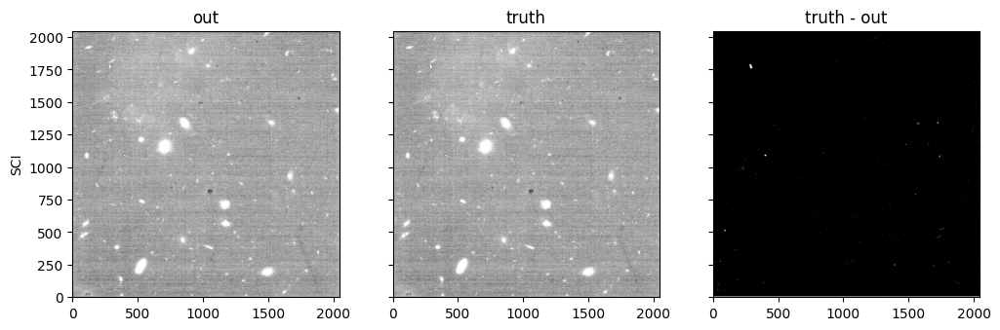

In [12]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

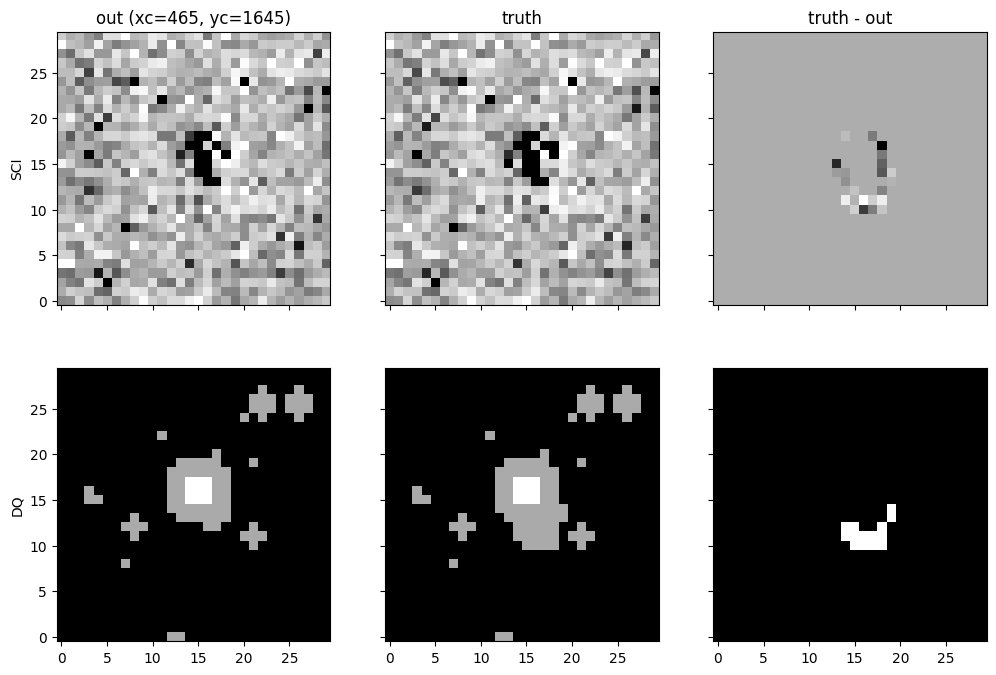

In [11]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff, xc=465, yc=1645, r=15,
     imshow_kwargs={
         "im2": {"interval": MinMaxInterval(),"stretch": LinearStretch()},
         "im3": {"interval": MinMaxInterval(),"stretch": LinearStretch()},
         "im4": {"interval": MinMaxInterval(),"stretch": LinearStretch()}})

# Failure 2/38

`jwst/regtest/test_nircam_image.py`

`test_nircam_image_detector1_with_likelihood[likely_rateints]`

In [13]:
suffix = "likely_rateints"
output = f"jw01345001001_10201_00001_nrca3_{suffix}.fits"

out_file = rt_results_path / f"3526_test_nircam_image_detector1_with_likelihood/{output}"
truth_file = bidata_path / f"test_nircam_image_likelihood/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
28 different pixels found
Maximum relative difference: 79.61653137207031
Maximum absolute difference: 20.931142807006836
*** DQ ***
15 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [14]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [15]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


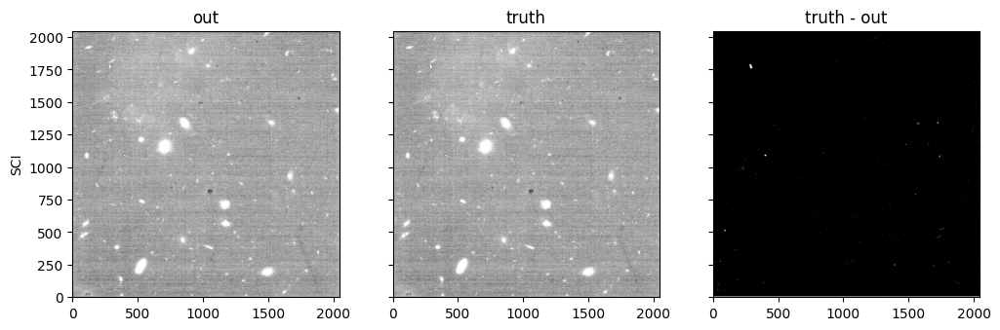

In [16]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

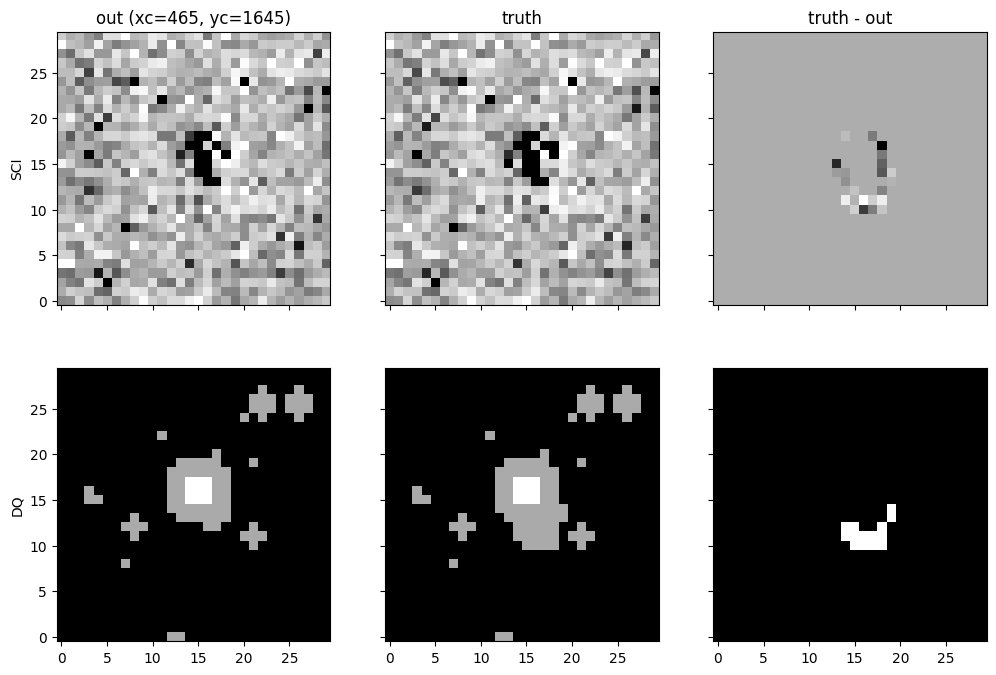

In [17]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff, xc=465, yc=1645, r=15,
     imshow_kwargs={
         "im2": {"interval": MinMaxInterval(),"stretch": LinearStretch()},
         "im3": {"interval": MinMaxInterval(),"stretch": LinearStretch()},
         "im4": {"interval": MinMaxInterval(),"stretch": LinearStretch()}})

# Failure 3/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1[jump]`

In [18]:
suffix = "jump"
truth_dir = "test_niriss_image"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3588_test_niriss_image_detector1/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0
*** DQ ***
78 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [19]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [20]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


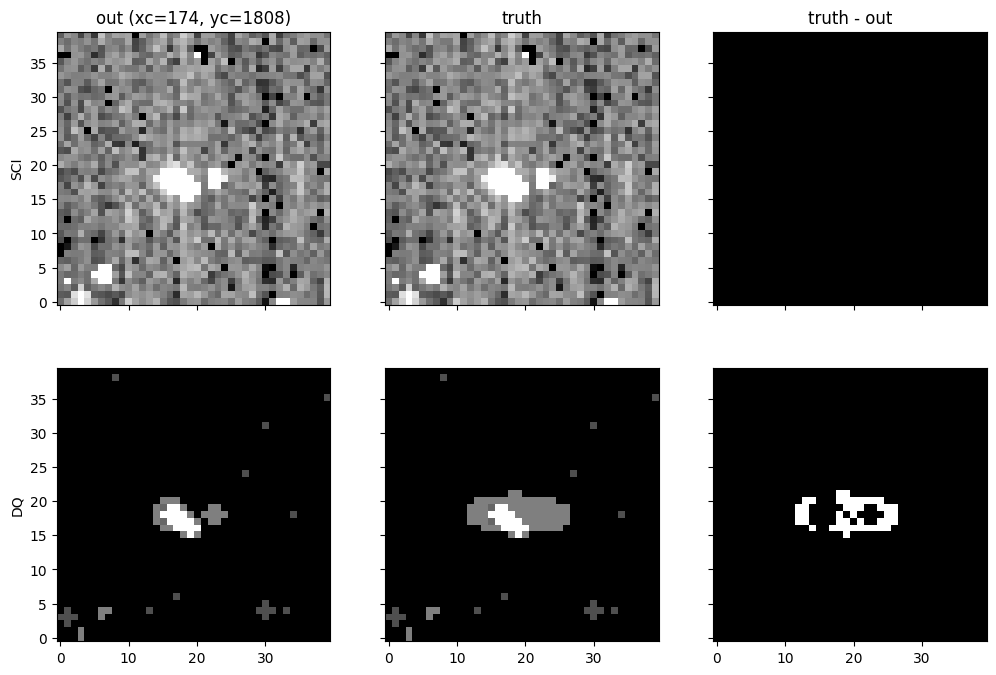

In [22]:
# Zoomed in
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...],
     dq_out[1, ...], dq_truth[1, ...], dq_diff[1, ...],
     xc=174, yc=1808, r=20)

# Failure 4/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1[rate]`

In [23]:
suffix = "rate"
truth_dir = "test_niriss_image"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3589_test_niriss_image_detector1/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
70 different pixels found
Maximum relative difference: 2.4561338424682617
Maximum absolute difference: 0.27292710542678833
*** DQ ***
66 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [24]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [25]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


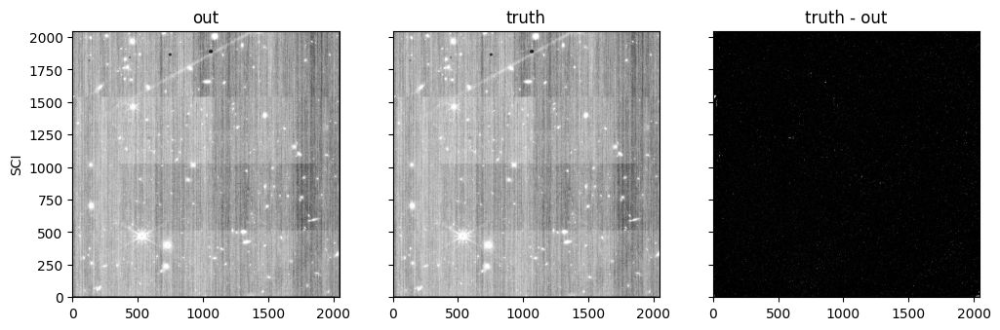

In [27]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

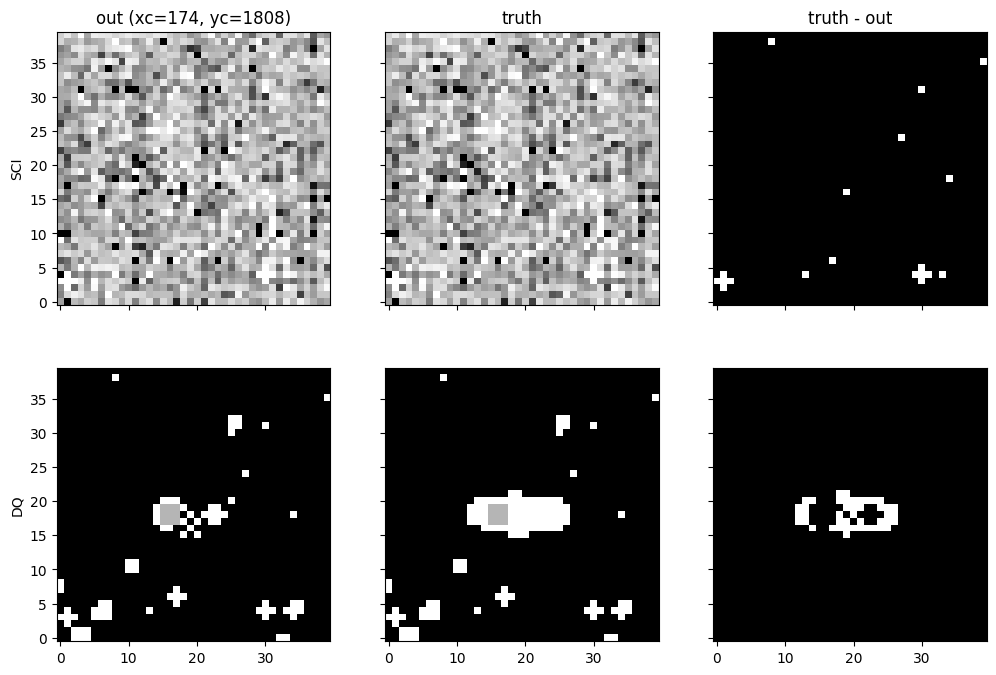

In [28]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff, xc=174, yc=1808, r=20,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(95), "stretch": SqrtStretch()},
         "im4": {"interval": PercentileInterval(95), "stretch": SqrtStretch()}})

# Failure 5/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1[rateints]`

In [29]:
suffix = "rateints"
truth_dir = "test_niriss_image"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3590_test_niriss_image_detector1/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
74 different pixels found
Maximum relative difference: 150.84364318847656
Maximum absolute difference: 0.6404761672019958
*** DQ ***
77 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [30]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [31]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


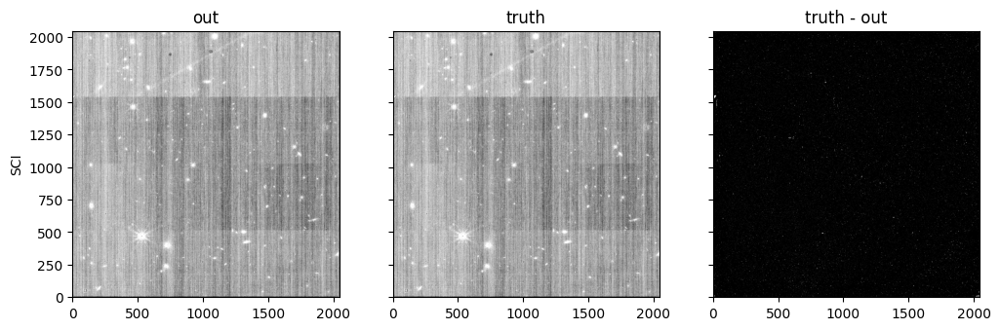

In [33]:
# Whole frame
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...], None, None, None)

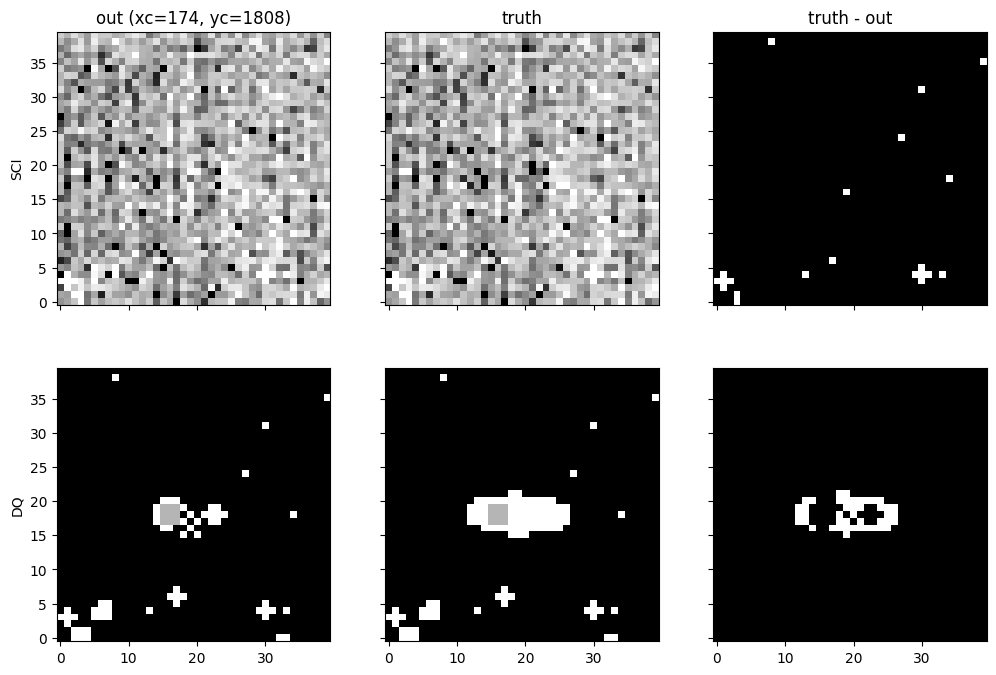

In [34]:
# Zoomed in
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...],
     dq_out[1, ...], dq_truth[1, ...], dq_diff[1, ...],
     xc=174, yc=1808, r=20,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(95), "stretch": SqrtStretch()},
         "im4": {"interval": PercentileInterval(95), "stretch": SqrtStretch()}})

# Failure 6/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_with_clean_flicker_noise[cfn_clean_flicker_noise]`

In [35]:
suffix = "cfn_clean_flicker_noise"
truth_dir = "test_niriss_image_clean_flicker_noise"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3591_test_niriss_image_detector1_with_clean_flicker_noise/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
675375 different pixels found
Maximum relative difference: 491.5208435058594
Maximum absolute difference: 0.0557708740234375
*** DQ ***
78 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [36]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [37]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


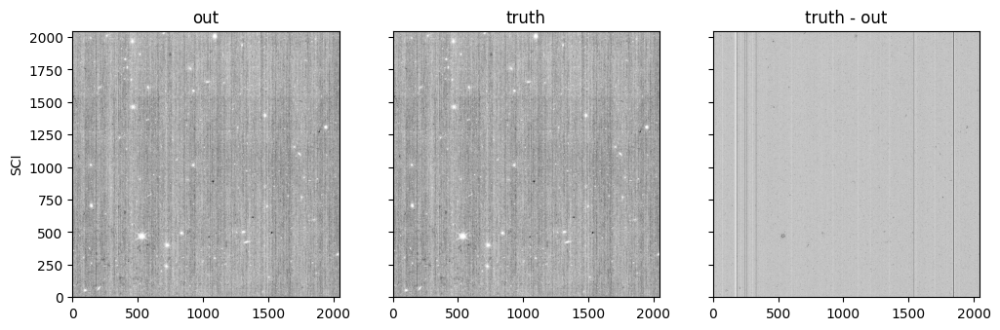

In [38]:
# Whole frame
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...], None, None, None)

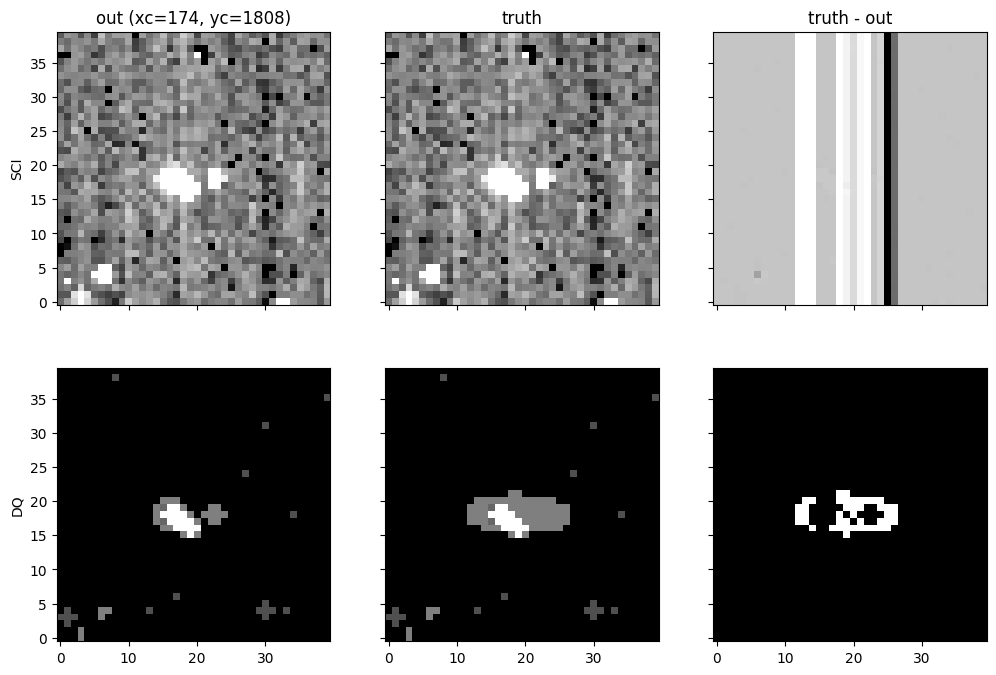

In [39]:
# Zoomed in
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...],
     dq_out[1, ...], dq_truth[1, ...], dq_diff[1, ...],
     xc=174, yc=1808, r=20)

# Failure 7/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_with_clean_flicker_noise[mask]`

In [40]:
suffix = "mask"
truth_dir = "test_niriss_image_clean_flicker_noise"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3592_test_niriss_image_detector1_with_clean_flicker_noise/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

# No DQ extension

*** SCI ***
13 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 1.0


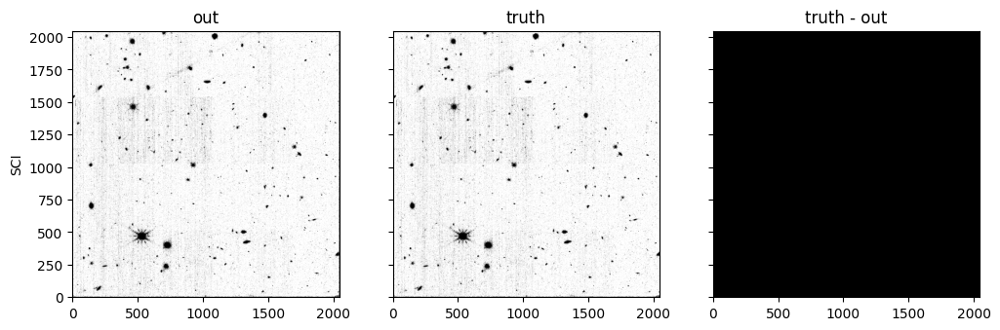

In [41]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

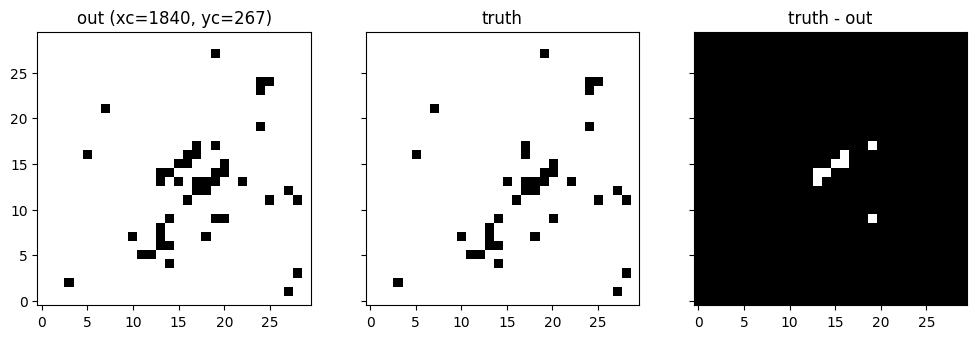

In [42]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff, None, None, None,
     xc=1840, yc=267, r=15,
     dq_as_sci=True, suppress_ylabel=True)

# Failure 8/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_with_clean_flicker_noise[flicker_bkg]`

In [43]:
suffix = "flicker_bkg"
truth_dir = "test_niriss_image_clean_flicker_noise"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3593_test_niriss_image_detector1_with_clean_flicker_noise/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0
*** DQ ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0


In [44]:
# The only difference is one keyword
fitsdiff_kwargs = {
    "ignore_hdus": ["ASDF"],
    "ignore_keywords": ignore_keywords,
    "ignore_fields": ignore_keywords,
    "rtol": 1e-4,
    "atol": 1e-4,
}
diff = fits.FITSDiff(out_file, truth_file, **fitsdiff_kwargs)
print(diff.report())


 fitsdiff: 7.2.0
 a: test_bigdata/jwst-pipeline-results/2025-12-23_GITHUB_CI_Linux-X64-py3.13-3145/3593_test_niriss_image_detector1_with_clean_flicker_noise/jw01094001002_02107_00001_nis_flicker_bkg.fits
 b: test_bigdata/jwst-pipeline/dev/truth/test_niriss_image_clean_flicker_noise/jw01094001002_02107_00001_nis_flicker_bkg.fits
 HDU(s) not to be compared:
  ASDF
 Keyword(s) not to be compared:
  CAL_VCS CAL_VER CRDS_CTX CRDS_VER DATE NAXIS1 TFORM*
 Table column(s) not to be compared:
  CAL_VCS CAL_VER CRDS_CTX CRDS_VER DATE NAXIS1 TFORM*
 Maximum number of different data values to be reported: 10
 Relative tolerance: 0.0001, Absolute tolerance: 0.0001

Primary HDU:

   Headers contain differences:
     Keyword EXTNCRS  has different values:
        a> 0.05263597298332256
        b> 0.05510328421691581



# Failure 9/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_with_clean_flicker_noise[flicker_noise]`

In [45]:
suffix = "flicker_noise"
truth_dir = "test_niriss_image_clean_flicker_noise"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3594_test_niriss_image_detector1_with_clean_flicker_noise/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
837752 different pixels found
Maximum relative difference: 8.0
Maximum absolute difference: 0.0557708740234375
*** DQ ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0


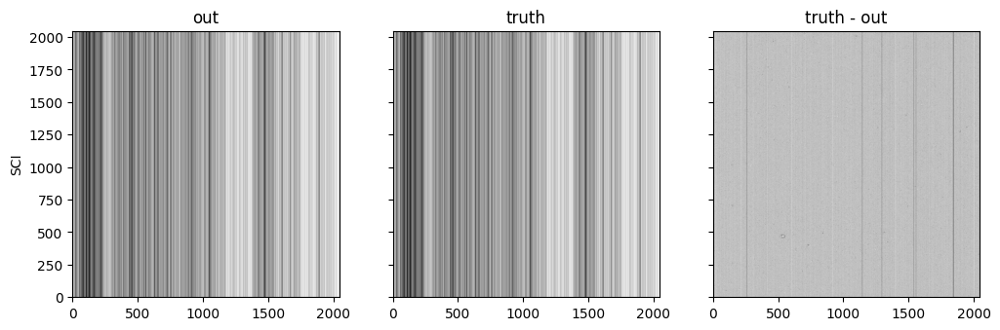

In [46]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

# Failure 10/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_with_clean_flicker_noise[cfn_ramp]`

In [47]:
suffix = "cfn_ramp"
truth_dir = "test_niriss_image_clean_flicker_noise"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3595_test_niriss_image_detector1_with_clean_flicker_noise/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
675375 different pixels found
Maximum relative difference: 491.5208435058594
Maximum absolute difference: 0.0557708740234375
*** DQ ***
78 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [48]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [49]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


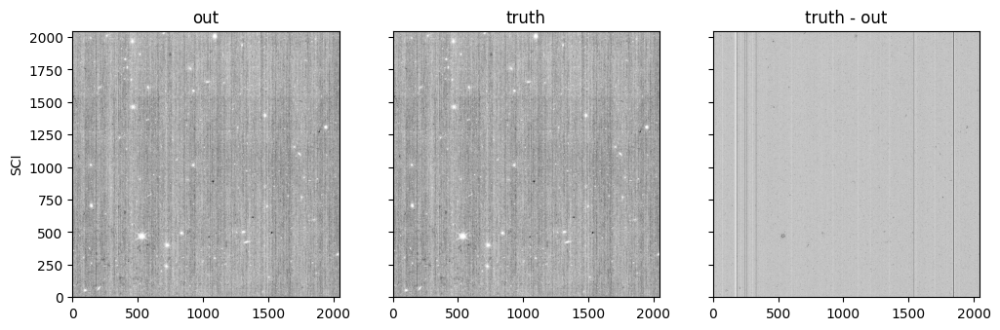

In [50]:
# Whole frame
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...], None, None, None)

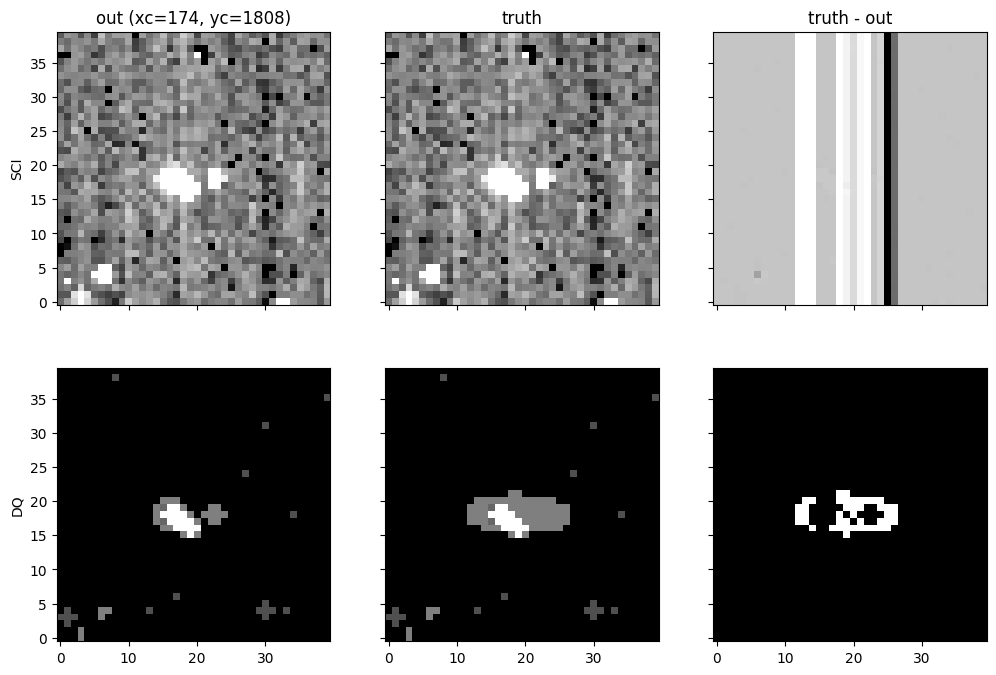

In [51]:
# Zoomed in
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...],
     dq_out[1, ...], dq_truth[1, ...], dq_diff[1, ...],
     xc=174, yc=1808, r=20)

# Failure 11/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_with_clean_flicker_noise[cfn_rate]`

In [52]:
suffix = "cfn_rate"
truth_dir = "test_niriss_image_clean_flicker_noise"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3596_test_niriss_image_detector1_with_clean_flicker_noise/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
14694 different pixels found
Maximum relative difference: 6.513303756713867
Maximum absolute difference: 0.26611605286598206
*** DQ ***
66 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [53]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [54]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


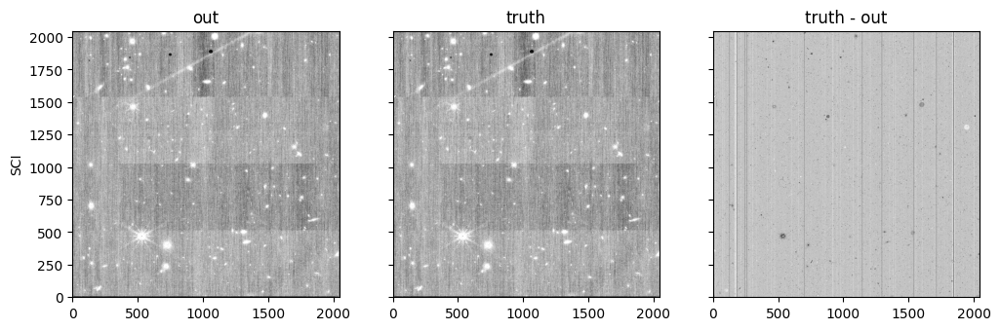

In [55]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

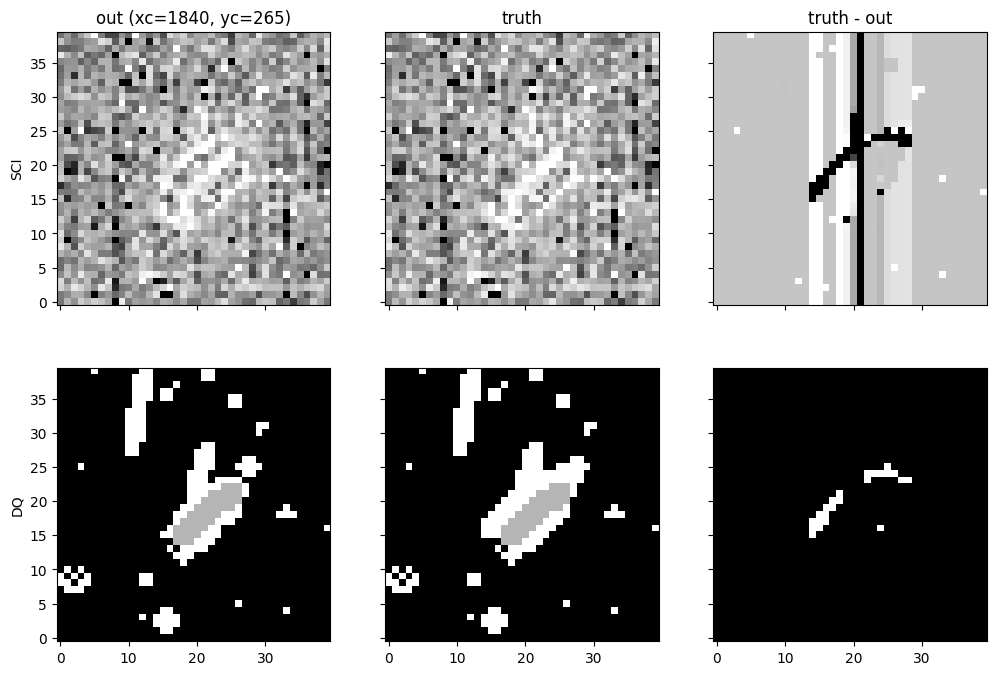

In [56]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1840, yc=265, r=20,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": SqrtStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": SqrtStretch()}})

# Failure 12/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_with_clean_flicker_noise[cfn_rateints]`

In [57]:
suffix = "cfn_rateints"
truth_dir = "test_niriss_image_clean_flicker_noise"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3597_test_niriss_image_detector1_with_clean_flicker_noise/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
64969 different pixels found
Maximum relative difference: 232.13983154296875
Maximum absolute difference: 0.6266952753067017
*** DQ ***
77 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [58]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [59]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


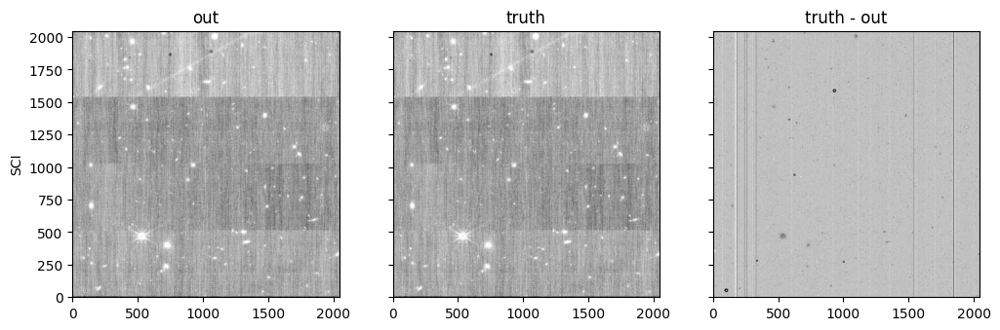

In [60]:
# Whole frame
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...], None, None, None)

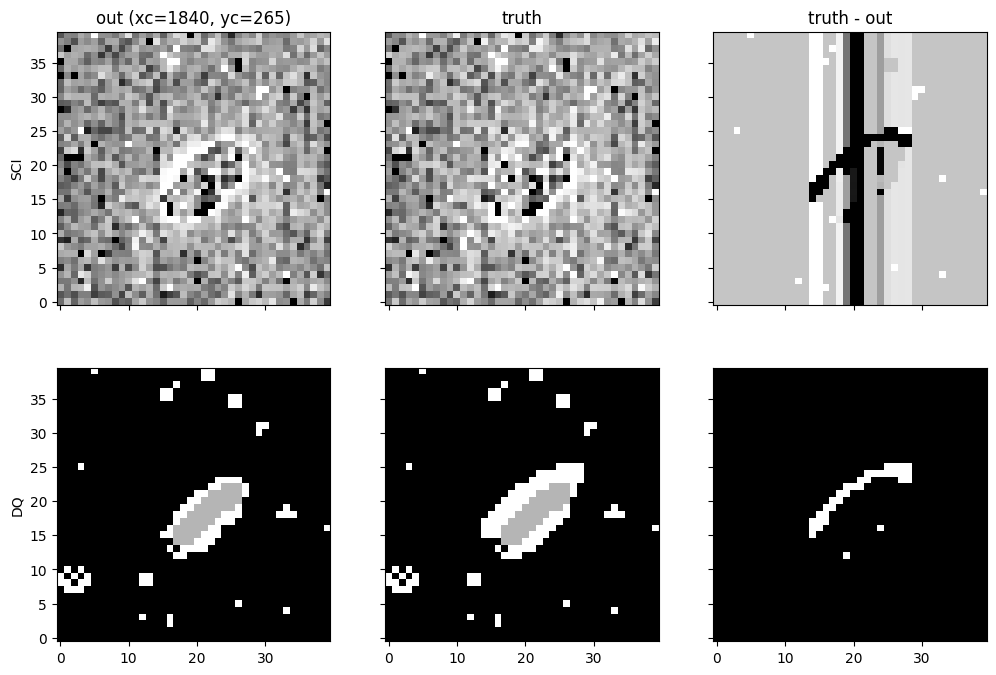

In [61]:
# Zoomed in
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...],
     dq_out[1, ...], dq_truth[1, ...], dq_diff[1, ...],
     xc=1840, yc=265, r=20,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": SqrtStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": SqrtStretch()}})

# Failure 13/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_with_likelihood[likely_rate]`

In [62]:
suffix = "likely_rate"
truth_dir = "test_niriss_image_likelihood"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3598_test_niriss_image_detector1_with_likelihood/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
69 different pixels found
Maximum relative difference: 2.1421144008636475
Maximum absolute difference: 0.16184979677200317
*** DQ ***
63 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [63]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [64]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


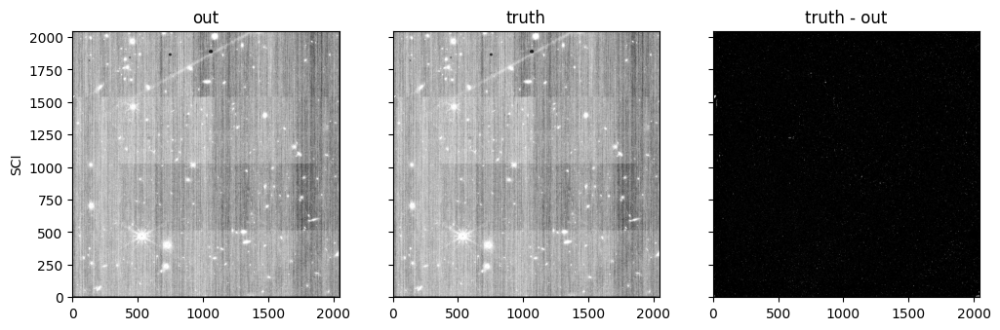

In [65]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

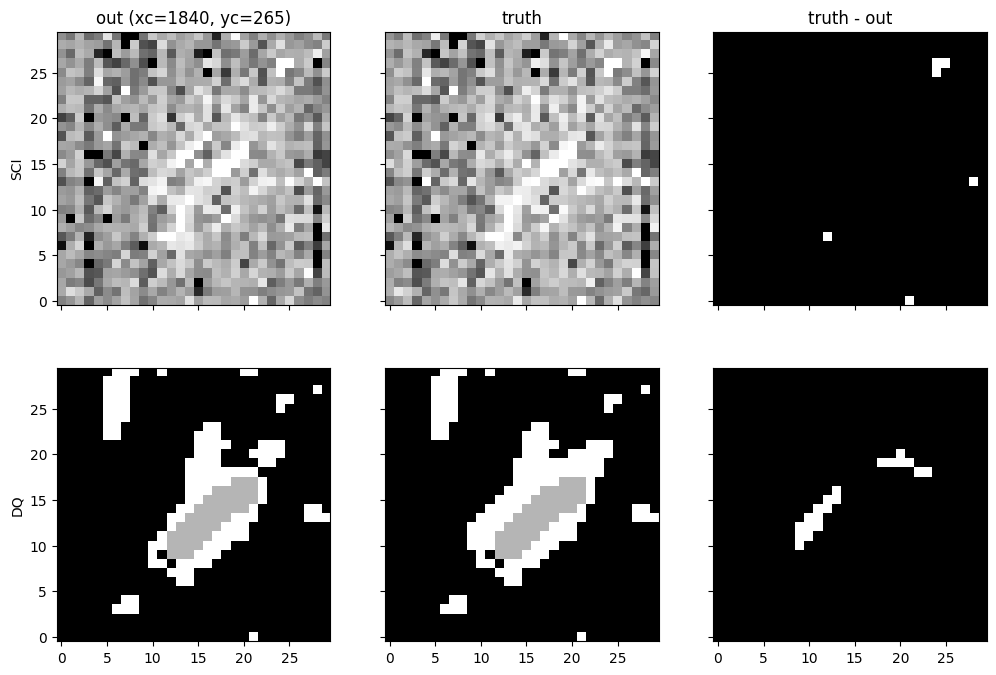

In [67]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1840, yc=265, r=15,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": SqrtStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": SqrtStretch()}})

# Failure 14/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_with_likelihood[likely_rateints]`

In [68]:
suffix = "likely_rateints"
truth_dir = "test_niriss_image_likelihood"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3599_test_niriss_image_detector1_with_likelihood/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
70 different pixels found
Maximum relative difference: 44.732025146484375
Maximum absolute difference: 0.4980418086051941
*** DQ ***
74 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [69]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [70]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


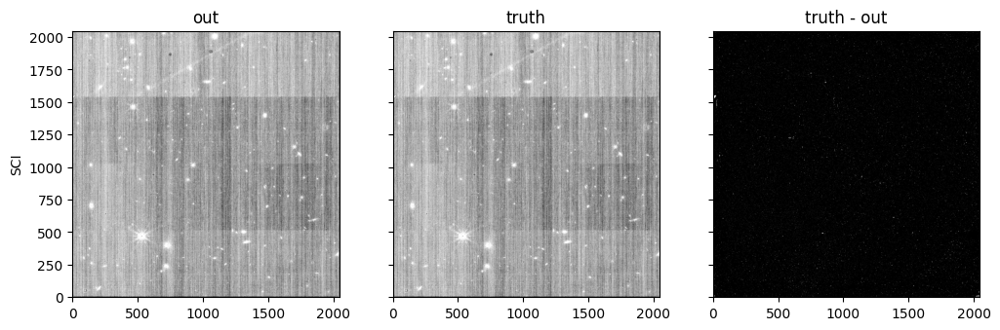

In [71]:
# Whole frame
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...], None, None, None)

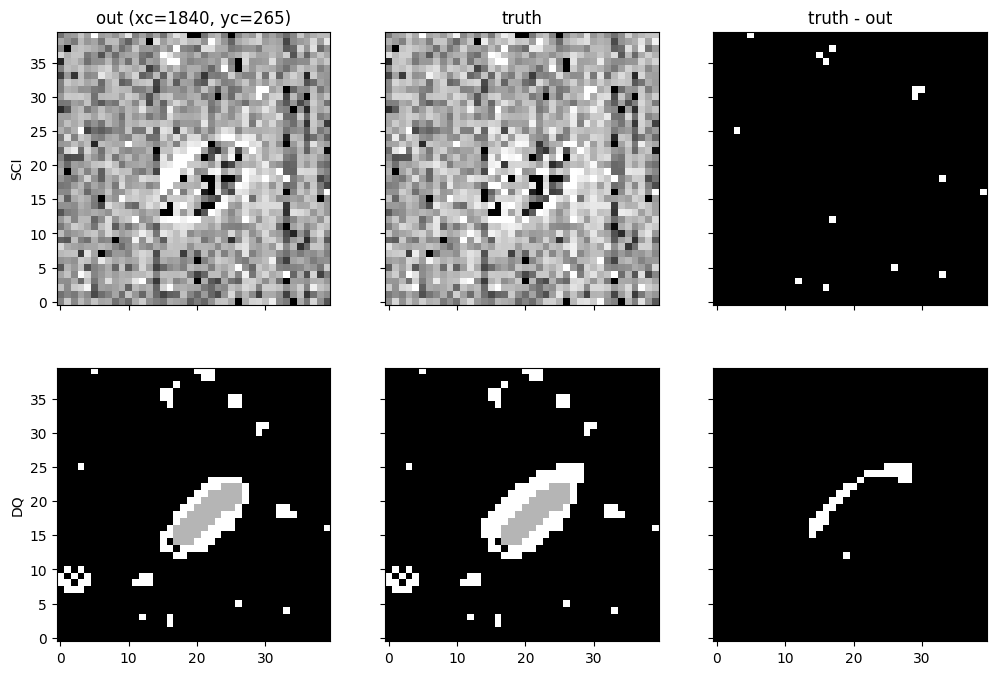

In [73]:
# Zoomed in
plot(sci_out[1, ...], sci_truth[1, ...], sci_diff[1, ...],
     dq_out[1, ...], dq_truth[1, ...], dq_diff[1, ...],
     xc=1840, yc=265, r=20,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": SqrtStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": SqrtStretch()}})

# Failure 15/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1[jump]`

In [74]:
suffix = "jump"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3795_test_nirspec_irs2_detector1/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_detector1/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0
*** DQ ***
4782 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [75]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [76]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


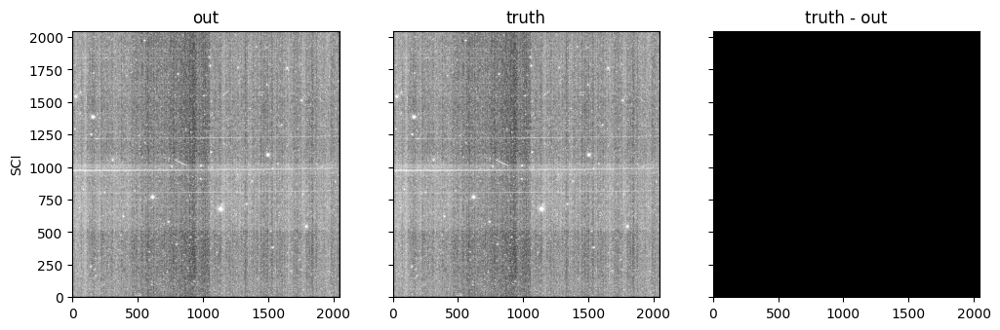

In [86]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None,
    imshow_kwargs={
         "im0": {"interval": PercentileInterval(85), "stretch": AsinhStretch()},
         "im1": {"interval": PercentileInterval(85), "stretch": AsinhStretch()}})

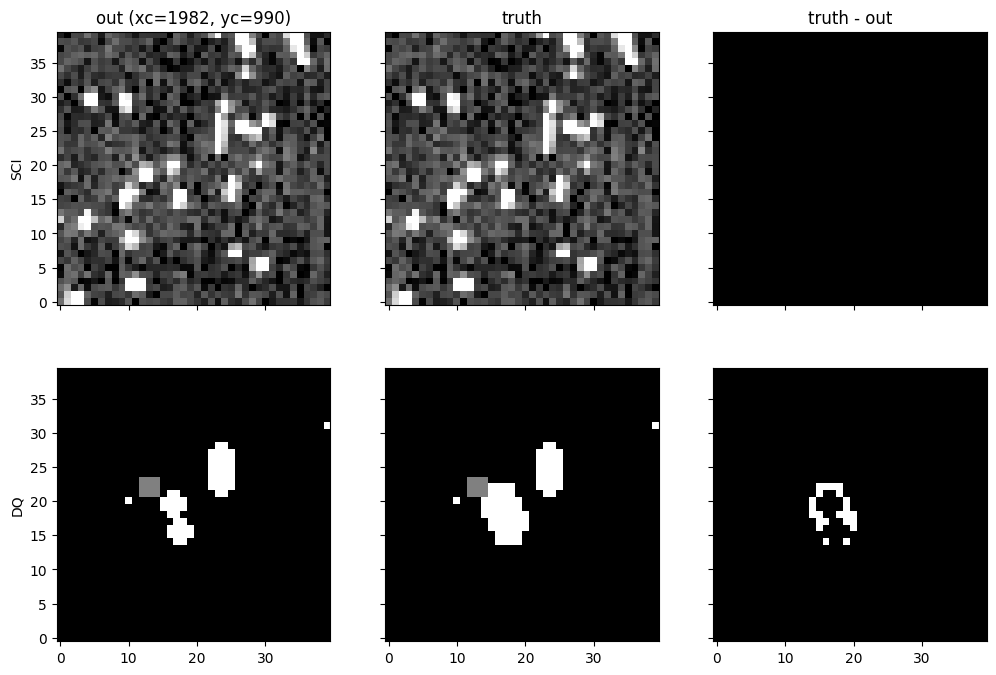

In [96]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1982, yc=990, r=20,
     imshow_kwargs={
         "im0": {"interval": PercentileInterval(90), "stretch": AsinhStretch()},
         "im1": {"interval": PercentileInterval(90), "stretch": AsinhStretch()},
         "im3": {"interval": MinMaxInterval(), "stretch": LinearStretch()},
         "im4": {"interval": MinMaxInterval(), "stretch": LinearStretch()}})

# Failure 16/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1[0_ramp_fit]`

In [97]:
suffix = "0_ramp_fit"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3796_test_nirspec_irs2_detector1/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_detector1/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
4265 different pixels found
Maximum relative difference: 1566.0487060546875
Maximum absolute difference: 0.3345804810523987
*** DQ ***
2534 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 5.0


In [98]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [99]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET
5: JUMP_DET, DO_NOT_USE


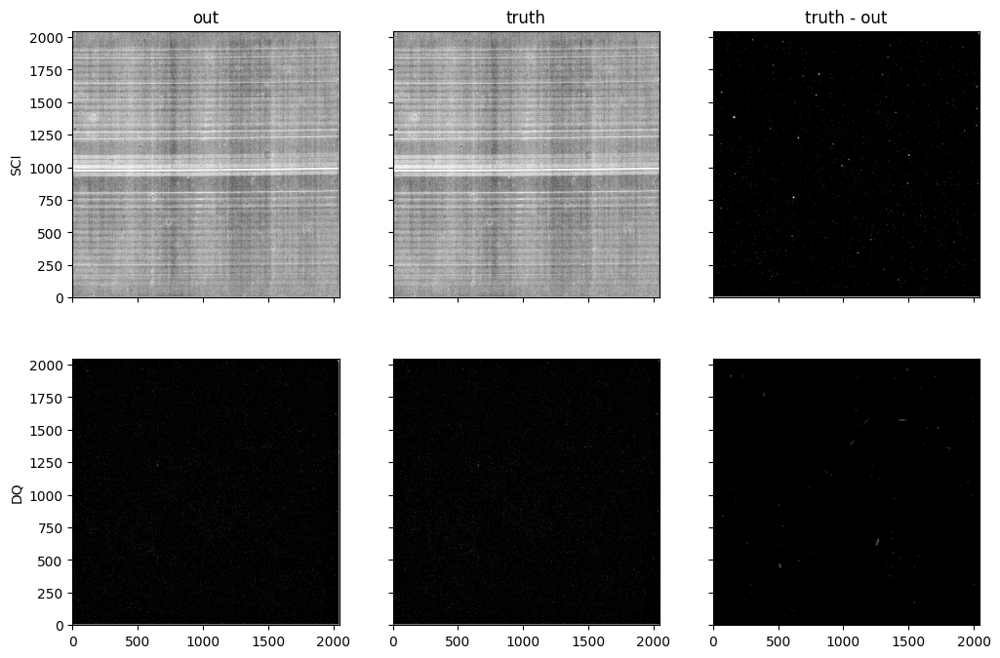

In [105]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff,
     imshow_kwargs={
         "im0": {"interval": PercentileInterval(90), "stretch": SqrtStretch()},
         "im1": {"interval": PercentileInterval(90), "stretch": SqrtStretch()}})

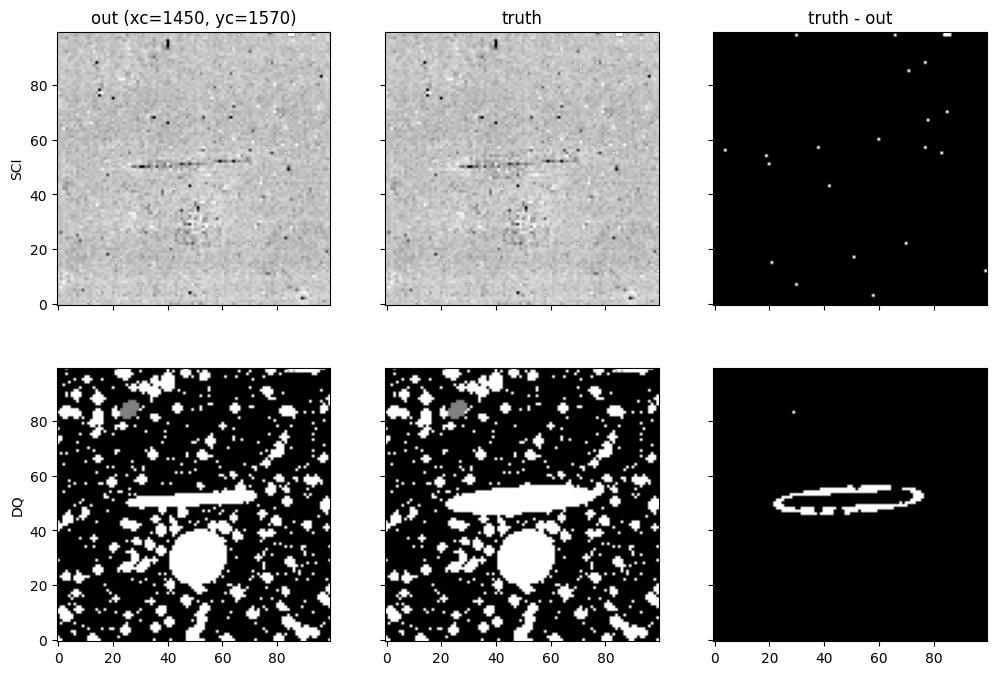

In [120]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1450, yc=1570, r=50,
     imshow_kwargs={
         "im0": {"interval": ZScaleInterval(), "stretch": AsinhStretch()},
         "im1": {"interval": ZScaleInterval(), "stretch": AsinhStretch()},
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 17/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1[gain_scale]`

In [121]:
suffix = "gain_scale"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3797_test_nirspec_irs2_detector1/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_detector1/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
4265 different pixels found
Maximum relative difference: 1566.0487060546875
Maximum absolute difference: 0.3345804810523987
*** DQ ***
2534 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 5.0


In [122]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [123]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET
5: JUMP_DET, DO_NOT_USE


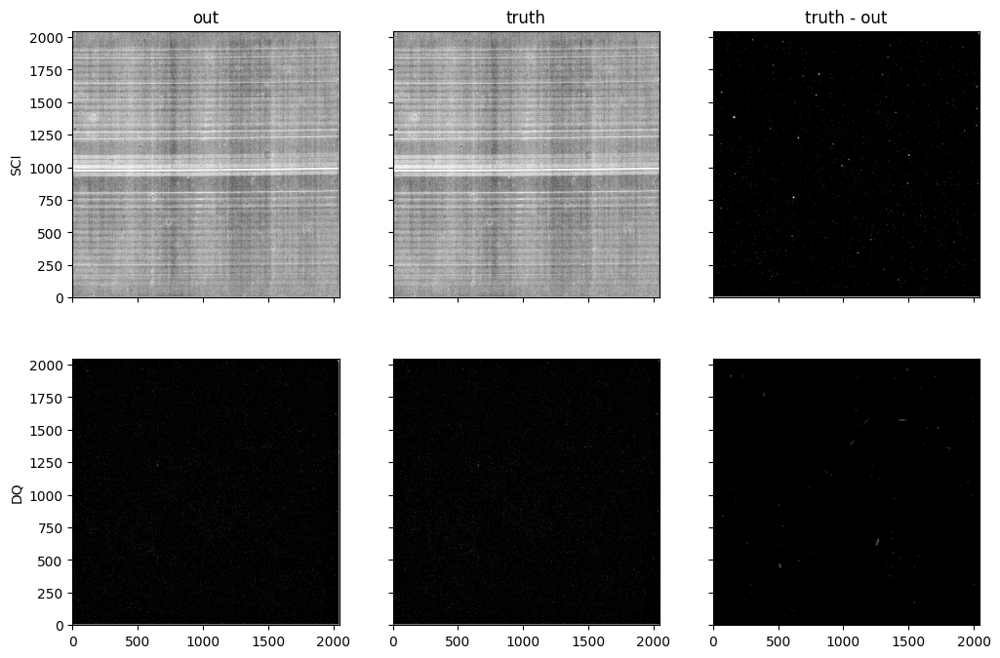

In [125]:
# Whole frame
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     imshow_kwargs={
         "im0": {"interval": PercentileInterval(90), "stretch": SqrtStretch()},
         "im1": {"interval": PercentileInterval(90), "stretch": SqrtStretch()}})

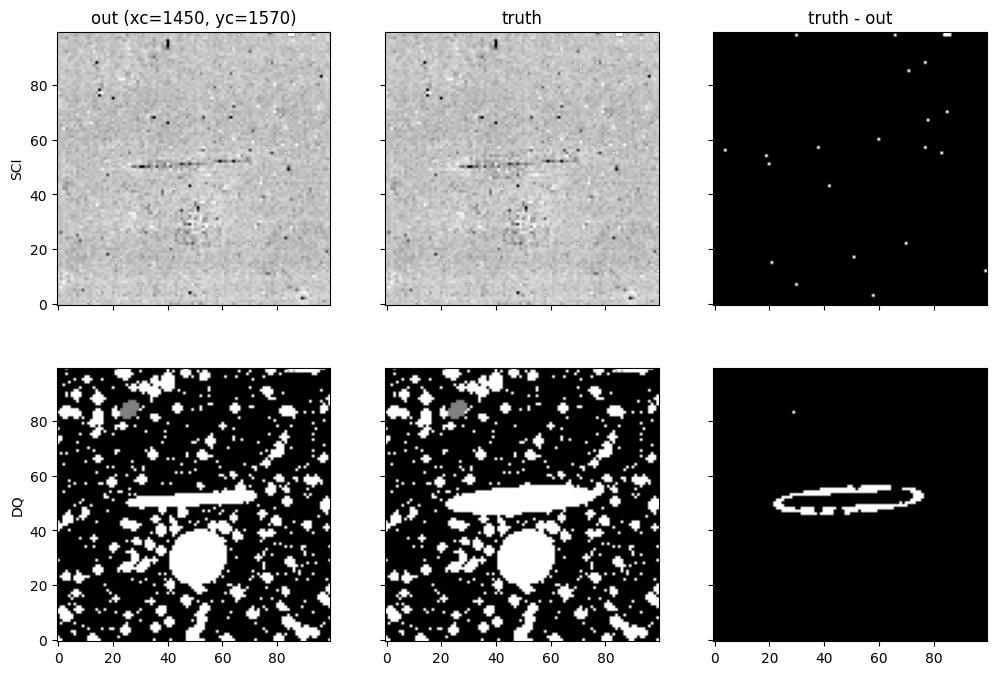

In [126]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1450, yc=1570, r=50,
     imshow_kwargs={
         "im0": {"interval": ZScaleInterval(), "stretch": AsinhStretch()},
         "im1": {"interval": ZScaleInterval(), "stretch": AsinhStretch()},
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 18/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1[rate]`

In [127]:
suffix = "rate"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3798_test_nirspec_irs2_detector1/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_detector1/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
4265 different pixels found
Maximum relative difference: 1566.0487060546875
Maximum absolute difference: 0.3345804810523987
*** DQ ***
2534 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 5.0


In [128]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [129]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET
5: JUMP_DET, DO_NOT_USE


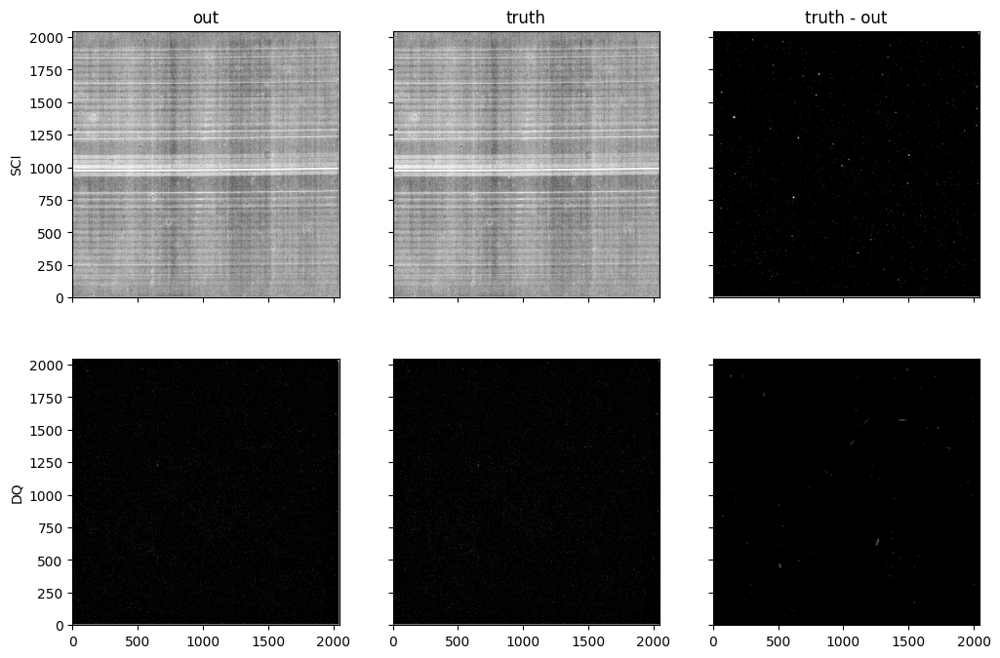

In [131]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff,
     imshow_kwargs={
         "im0": {"interval": PercentileInterval(90), "stretch": SqrtStretch()},
         "im1": {"interval": PercentileInterval(90), "stretch": SqrtStretch()}})

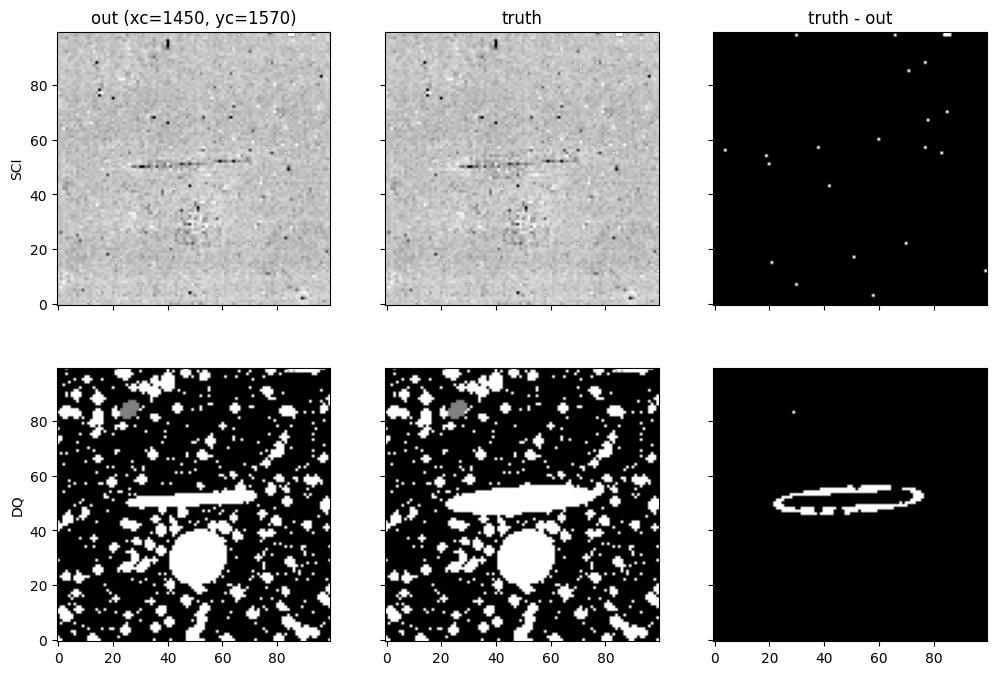

In [132]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1450, yc=1570, r=50,
     imshow_kwargs={
         "im0": {"interval": ZScaleInterval(), "stretch": AsinhStretch()},
         "im1": {"interval": ZScaleInterval(), "stretch": AsinhStretch()},
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 19/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1_with_clean_flicker_noise[cfn_clean_flicker_noise]`

In [133]:
suffix = "cfn_clean_flicker_noise"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3799_test_nirspec_irs2_detector1_with_clean_flicker_noise/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_clean_flicker_noise/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
9724069 different pixels found
Maximum relative difference: 1416.3538818359375
Maximum absolute difference: 0.140625
*** DQ ***
4782 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [134]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [135]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


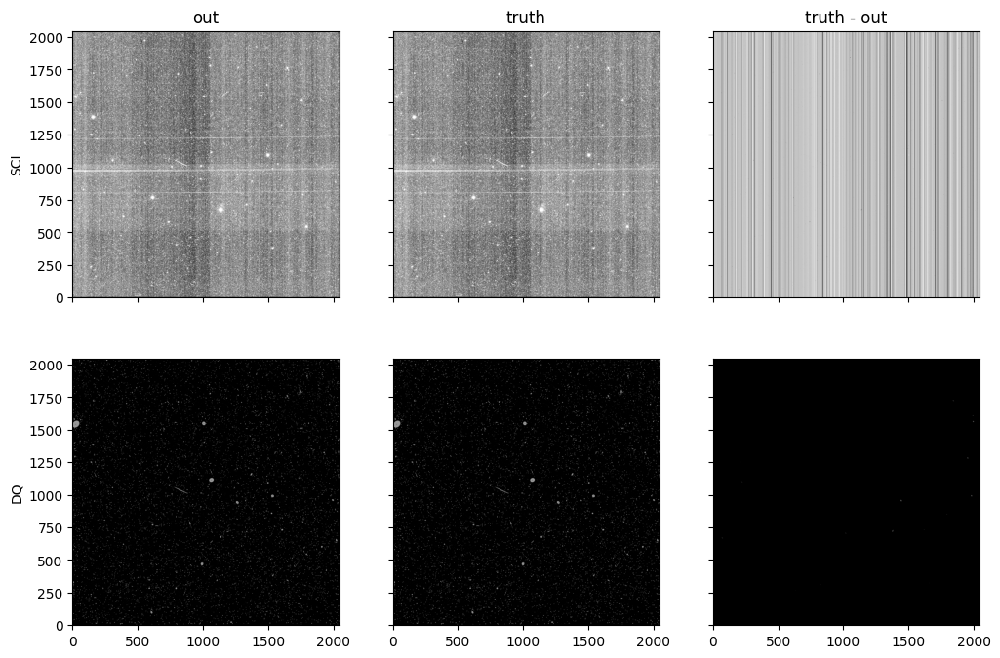

In [140]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff,
     imshow_kwargs={
         "im0": {"interval": PercentileInterval(85), "stretch": SqrtStretch()},
         "im1": {"interval": PercentileInterval(85), "stretch": SqrtStretch()}})

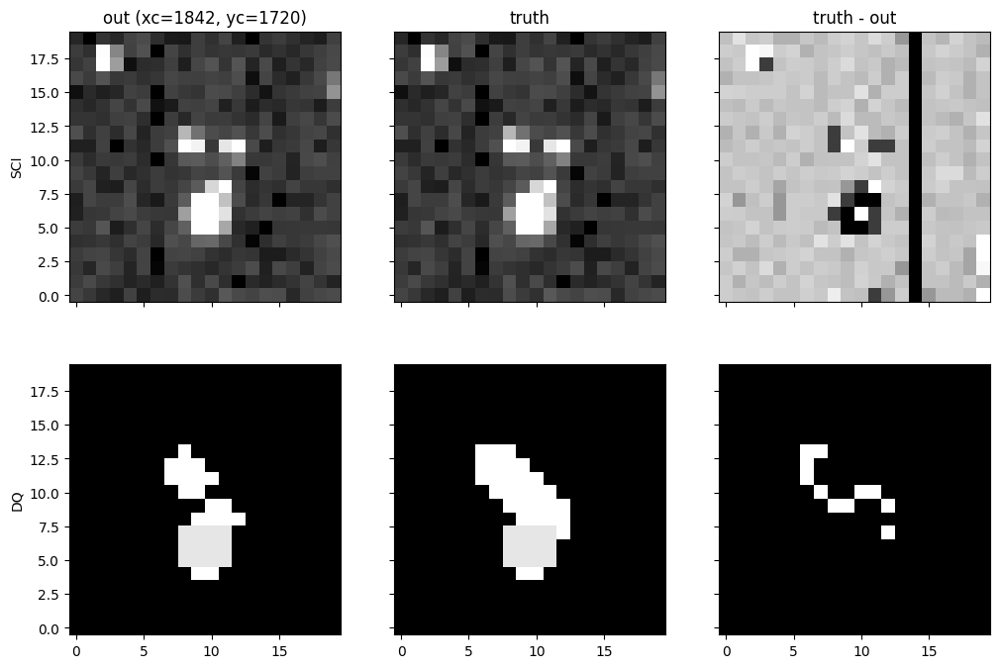

In [141]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1842, yc=1720, r=10)

# Failure 20/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1_with_clean_flicker_noise[mask]`

In [142]:
suffix = "mask"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3800_test_nirspec_irs2_detector1_with_clean_flicker_noise/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_clean_flicker_noise/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

# No DQ extension.

*** SCI ***
140 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 1.0


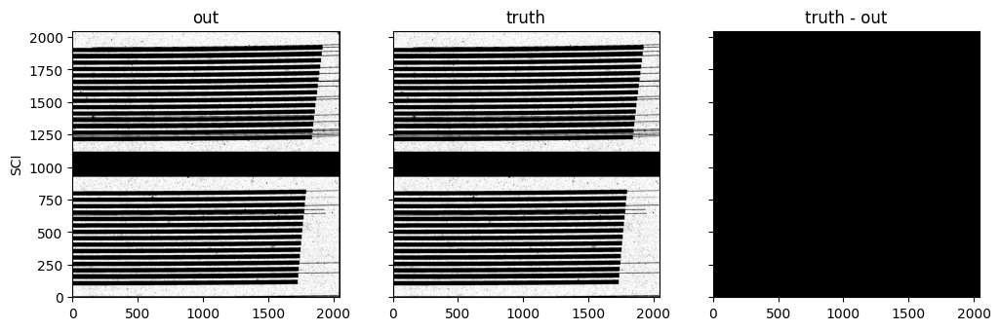

In [143]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

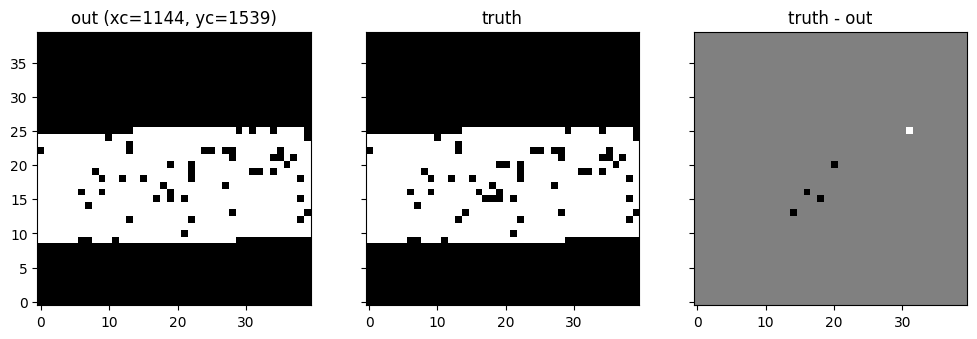

In [144]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff, None, None, None,
     xc=1144, yc=1539, r=20,
     dq_as_sci=True, suppress_ylabel=True)

# Failure 21/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1_with_clean_flicker_noise[flicker_bkg]`

In [145]:
suffix = "flicker_bkg"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3801_test_nirspec_irs2_detector1_with_clean_flicker_noise/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_clean_flicker_noise/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0
*** DQ ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0


In [146]:
# The only difference is one keyword
fitsdiff_kwargs = {
    "ignore_hdus": ["ASDF"],
    "ignore_keywords": ignore_keywords,
    "ignore_fields": ignore_keywords,
    "rtol": 1e-4,
    "atol": 1e-4,
}
diff = fits.FITSDiff(out_file, truth_file, **fitsdiff_kwargs)
print(diff.report())


 fitsdiff: 7.2.0
 a: test_bigdata/jwst-pipeline-results/2025-12-23_GITHUB_CI_Linux-X64-py3.13-3145/3801_test_nirspec_irs2_detector1_with_clean_flicker_noise/jw01335004001_03101_00002_nrs2_flicker_bkg.fits
 b: test_bigdata/jwst-pipeline/dev/truth/test_nirspec_irs2_clean_flicker_noise/jw01335004001_03101_00002_nrs2_flicker_bkg.fits
 HDU(s) not to be compared:
  ASDF
 Keyword(s) not to be compared:
  CAL_VCS CAL_VER CRDS_CTX CRDS_VER DATE NAXIS1 TFORM*
 Table column(s) not to be compared:
  CAL_VCS CAL_VER CRDS_CTX CRDS_VER DATE NAXIS1 TFORM*
 Maximum number of different data values to be reported: 10
 Relative tolerance: 0.0001, Absolute tolerance: 0.0001

Primary HDU:

   Headers contain differences:
     Keyword EXTNCRS  has different values:
        a> 1.013233488243237
        b> 1.0805644877845617



# Failure 22/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1_with_clean_flicker_noise[flicker_noise]`

In [147]:
suffix = "flicker_noise"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3802_test_nirspec_irs2_detector1_with_clean_flicker_noise/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_clean_flicker_noise/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
42780626 different pixels found
Maximum relative difference: 32.5
Maximum absolute difference: 0.140625
*** DQ ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0


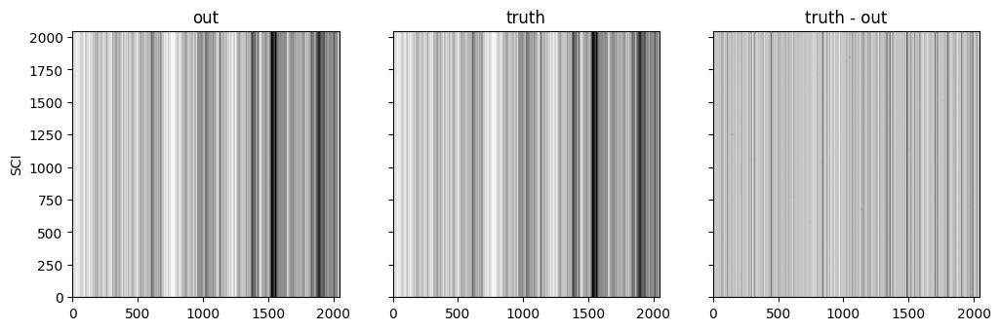

In [148]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

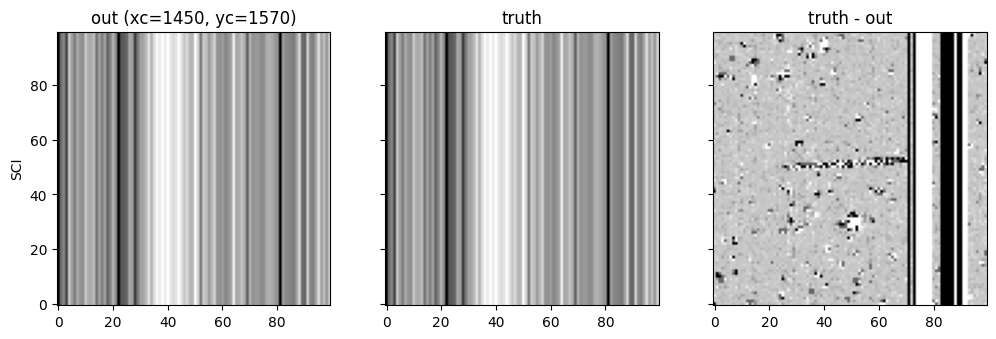

In [149]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff, None, None, None, xc=1450, yc=1570, r=50)

# Failure 23/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1_with_clean_flicker_noise[cfn_ramp]`

In [150]:
suffix = "cfn_ramp"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3803_test_nirspec_irs2_detector1_with_clean_flicker_noise/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_clean_flicker_noise/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
9724069 different pixels found
Maximum relative difference: 1416.3538818359375
Maximum absolute difference: 0.140625
*** DQ ***
4782 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [151]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [152]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


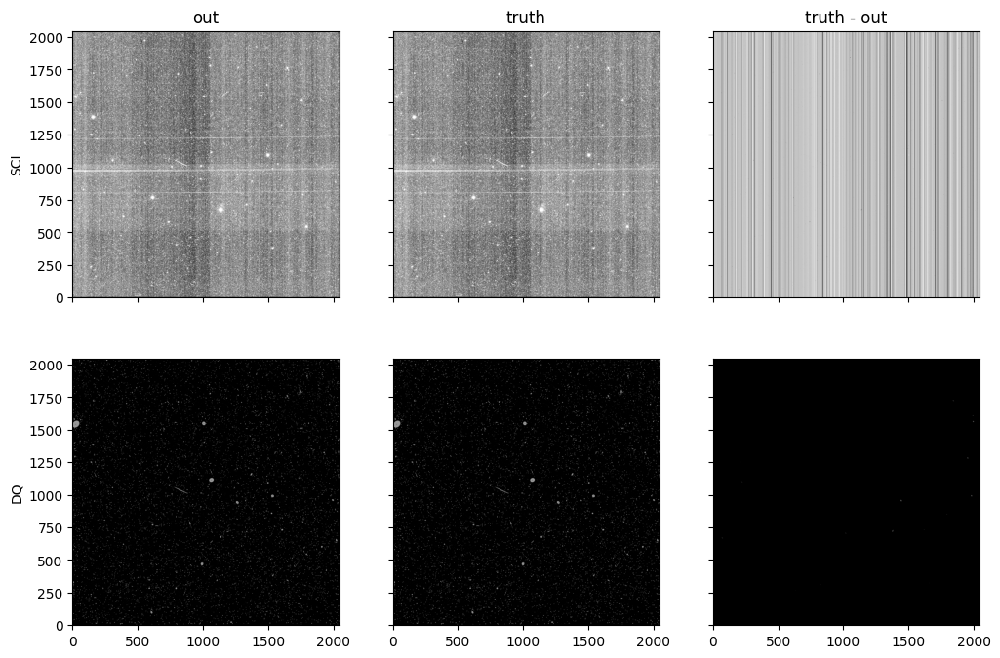

In [155]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff,
     imshow_kwargs={
         "im0": {"interval": PercentileInterval(85), "stretch": SqrtStretch()},
         "im1": {"interval": PercentileInterval(85), "stretch": SqrtStretch()}})

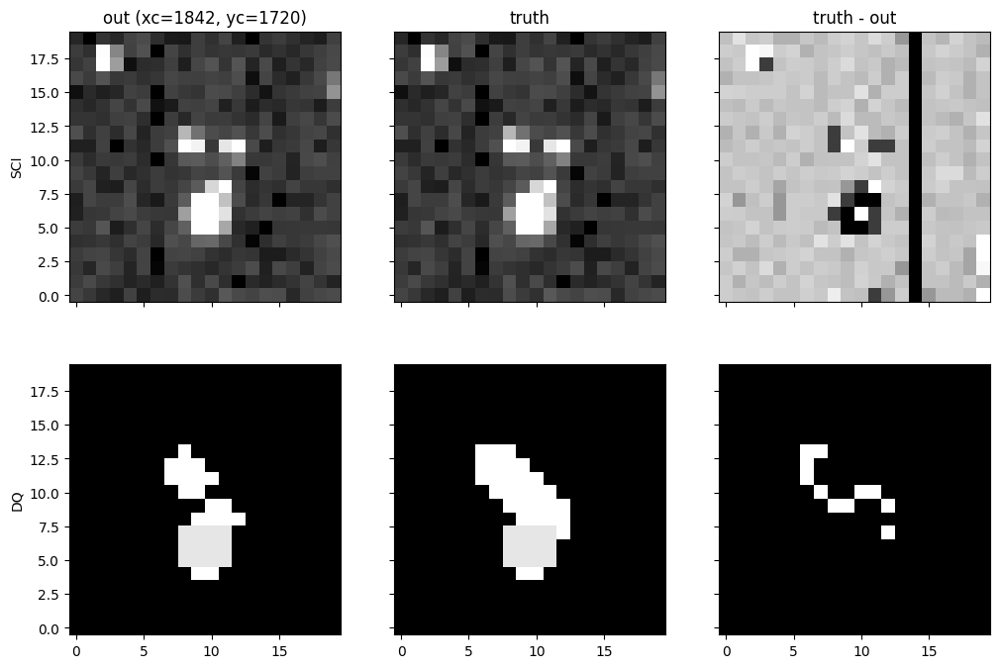

In [156]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff, xc=1842, yc=1720, r=10)

# Failure 24/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1_with_clean_flicker_noise[cfn_rate]`

In [157]:
suffix = "cfn_rate"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3804_test_nirspec_irs2_detector1_with_clean_flicker_noise/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_clean_flicker_noise/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
13043 different pixels found
Maximum relative difference: 3388.490966796875
Maximum absolute difference: 0.3436957001686096
*** DQ ***
2534 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 5.0


In [158]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [159]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET
5: JUMP_DET, DO_NOT_USE


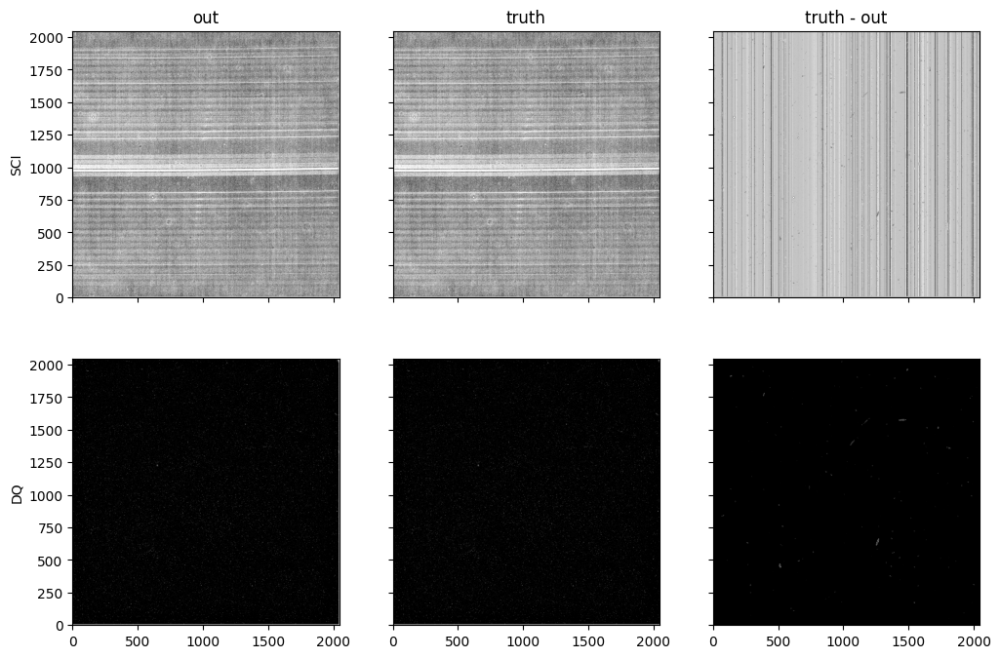

In [161]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff,
     imshow_kwargs={
         "im0": {"interval": PercentileInterval(85), "stretch": SqrtStretch()},
         "im1": {"interval": PercentileInterval(85), "stretch": SqrtStretch()}})

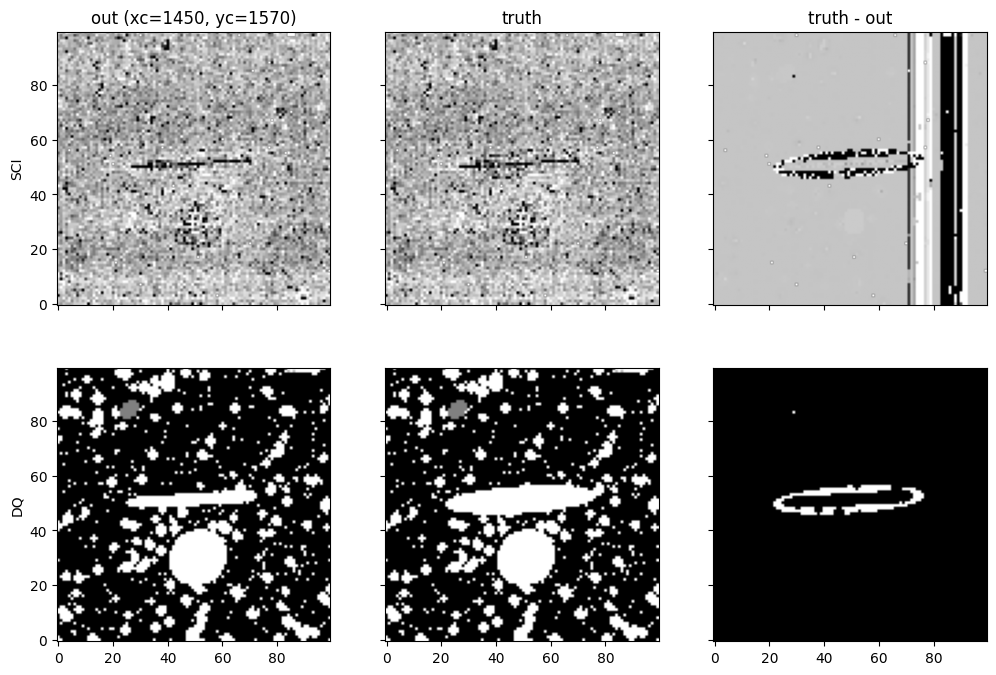

In [165]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1450, yc=1570, r=50,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 25/38

`jwst/regtest/test_nirspec_irs2_detector1.py`

`test_nirspec_irs2_detector1_with_clean_flicker_noise[cfn_rateints]`

In [166]:
suffix = "cfn_rateints"
output_filename = f"jw01335004001_03101_00002_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3805_test_nirspec_irs2_detector1_with_clean_flicker_noise/{output_filename}"
truth_file = bidata_path / f"test_nirspec_irs2_clean_flicker_noise/{output_filename}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
13043 different pixels found
Maximum relative difference: 3388.490966796875
Maximum absolute difference: 0.3436957001686096
*** DQ ***
2534 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 5.0


In [167]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [168]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET
5: JUMP_DET, DO_NOT_USE


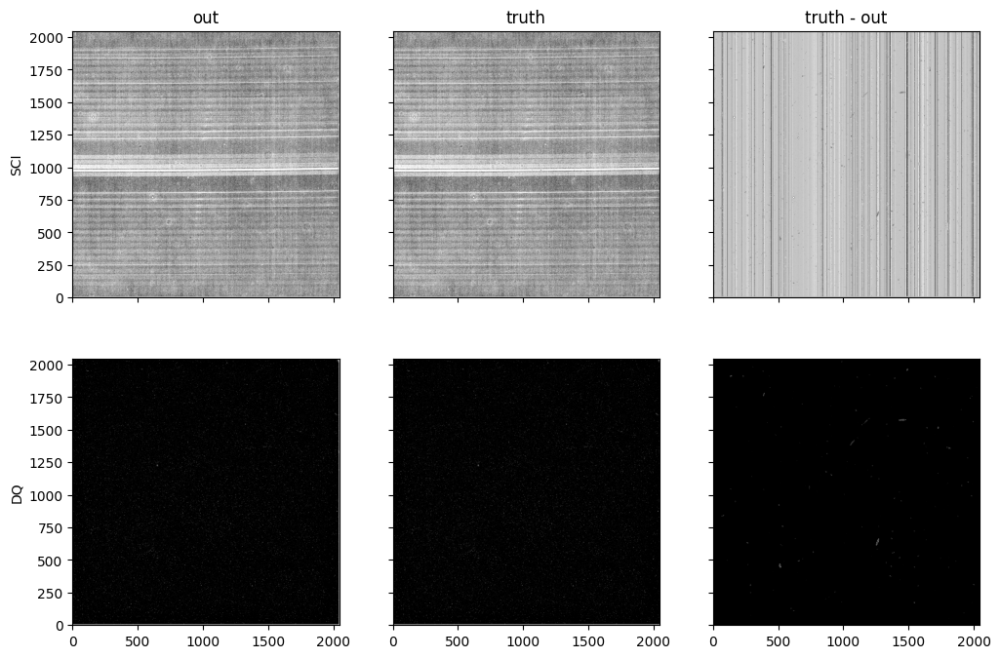

In [170]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff,
     imshow_kwargs={
         "im0": {"interval": PercentileInterval(85), "stretch": SqrtStretch()},
         "im1": {"interval": PercentileInterval(85), "stretch": SqrtStretch()}})

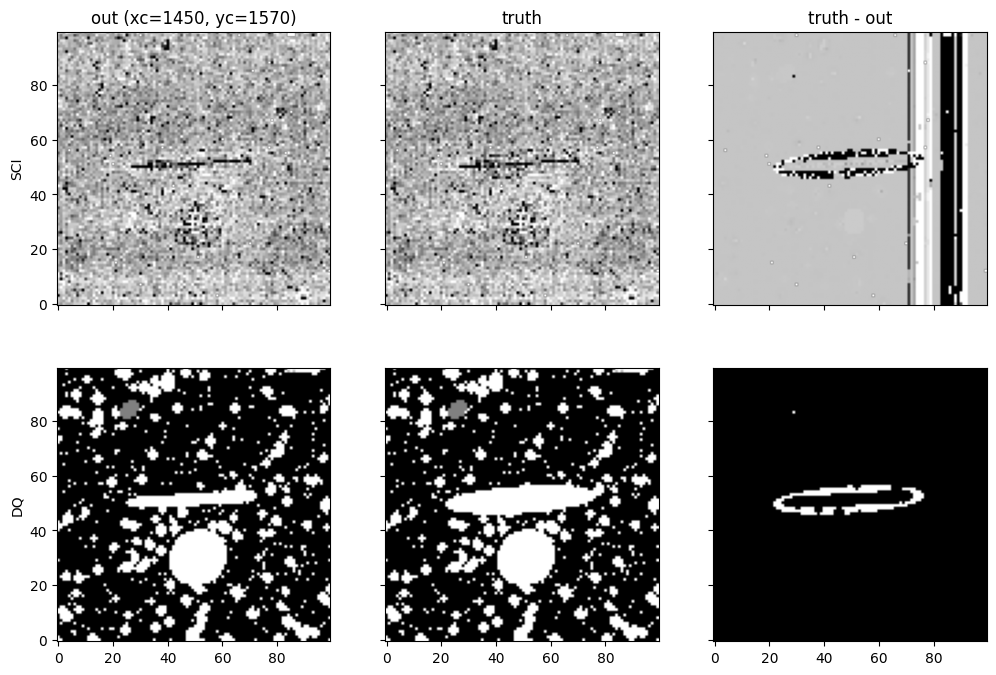

In [171]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1450, yc=1570, r=50,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 26/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_multiprocess_rate`

In [172]:
suffix = "rate"
truth_dir = "test_niriss_image"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3601_test_niriss_image_detector1_multiprocess_rate/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
70 different pixels found
Maximum relative difference: 2.4561338424682617
Maximum absolute difference: 0.27292710542678833
*** DQ ***
66 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [173]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [174]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


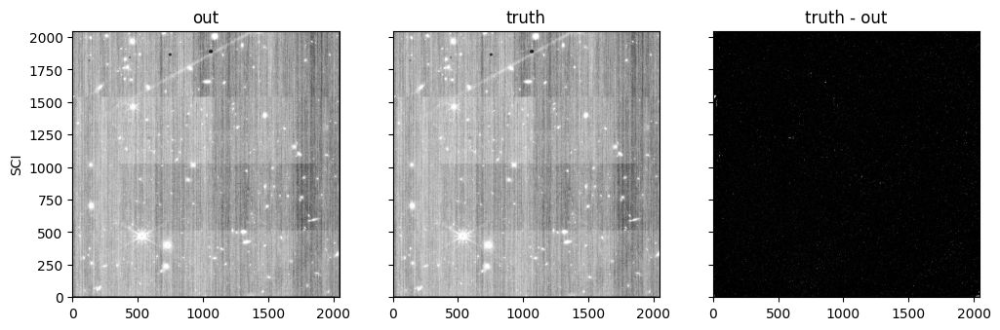

In [175]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

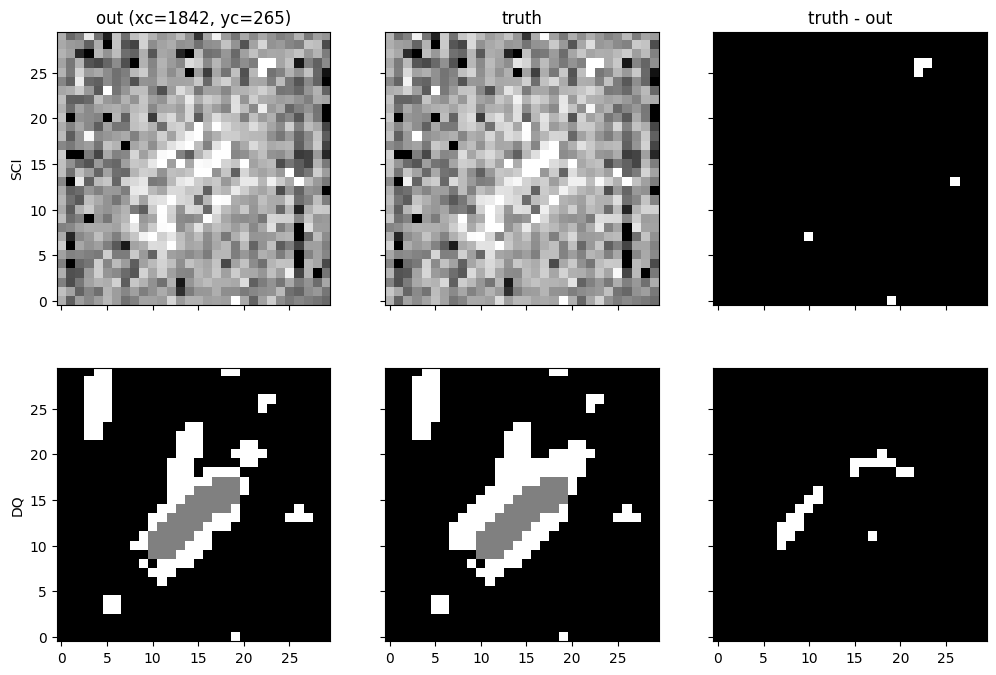

In [183]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1842, yc=265, r=15,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 27/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_multiprocess_rate_save_opt[rate]`

In [184]:
suffix = "rate"
truth_dir = "test_niriss_image"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3602_test_niriss_image_detector1_multiprocess_rate_save_opt/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
70 different pixels found
Maximum relative difference: 2.4561338424682617
Maximum absolute difference: 0.27292710542678833
*** DQ ***
66 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [185]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [186]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


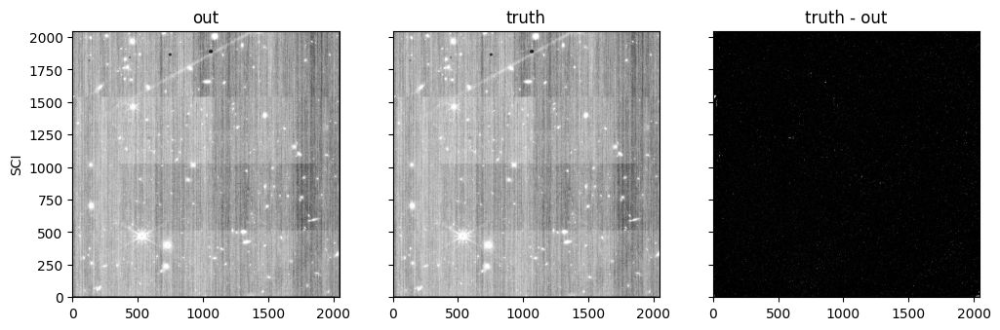

In [187]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

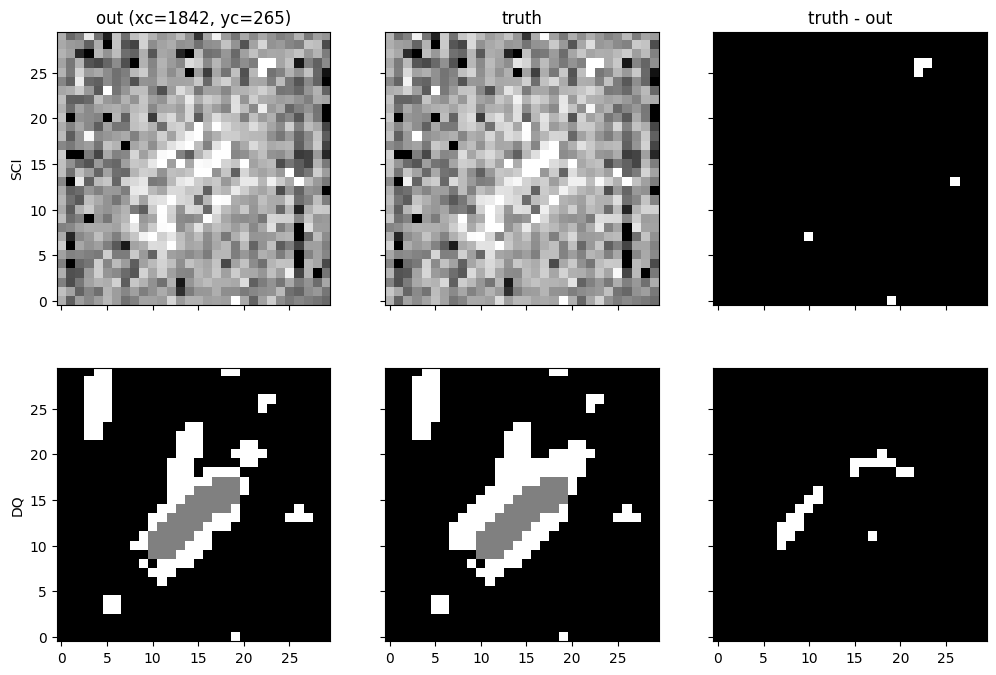

In [188]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1842, yc=265, r=15,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 28/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_multiprocess_rate_save_opt[fitopt]`

In [189]:
suffix = "fitopt"
truth_dir = "test_niriss_image"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3603_test_niriss_image_detector1_multiprocess_rate_save_opt/{output}"
truth_file = bidata_path / f"{truth_dir}/{output}"

# SCI is empty, no DQ
slope_out = fits.getdata(out_file, ext=("SLOPE", 1))
slope_truth = fits.getdata(truth_file, ext=("SLOPE", 1))
slope_diff = slope_truth - slope_out

i_slope_diff, max_absolute_slope, max_relative_slope = where_not_allclose(
    slope_out, slope_truth, rtol=1e-4, atol=1e-4, return_maxdiff=True
)
print("*** SLOPE ***")
print(f"{len(i_slope_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_slope}")
print(f"Maximum absolute difference: {max_absolute_slope}")

*** SLOPE ***
104 different pixels found
Maximum relative difference: 51.987159729003906
Maximum absolute difference: 0.7690457701683044


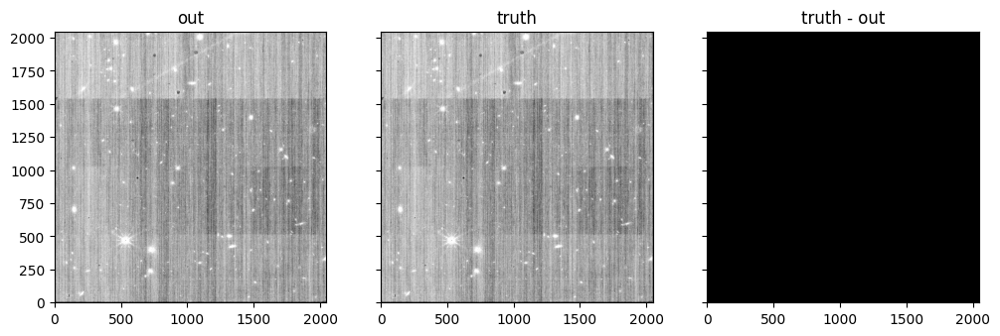

In [190]:
# Whole frame
plot(slope_out[1, 0, ...], slope_truth[1, 0, ...], slope_diff[1, 0, ...],
     None, None, None,
     suppress_ylabel=True)

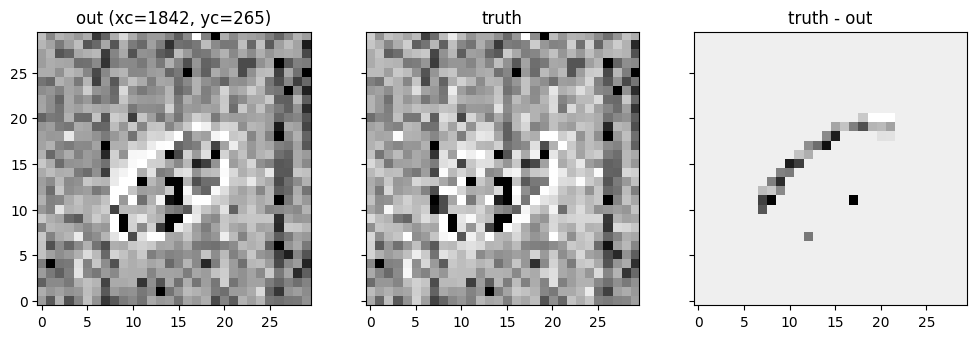

In [191]:
# Zoomed in
plot(slope_out[1, 0, ...], slope_truth[1, 0, ...], slope_diff[1, 0, ...],
     None, None, None,
     xc=1842, yc=265, r=15,
     dq_as_sci=True, suppress_ylabel=True)

# Failure 29/38

`jwst/regtest/test_nirspec_verify.py`

`test_verify_detector1[jump]`

In [192]:
ROOT = "jw01970002001_03101_00001_nrs1"
suffix = "jump"
output = f"{ROOT}_{suffix}.fits"

out_file = rt_results_path / f"3973_test_verify_detector1/{output}"
truth_file = bidata_path / f"test_nirspec_verify/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0
*** DQ ***
209 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [193]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [194]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


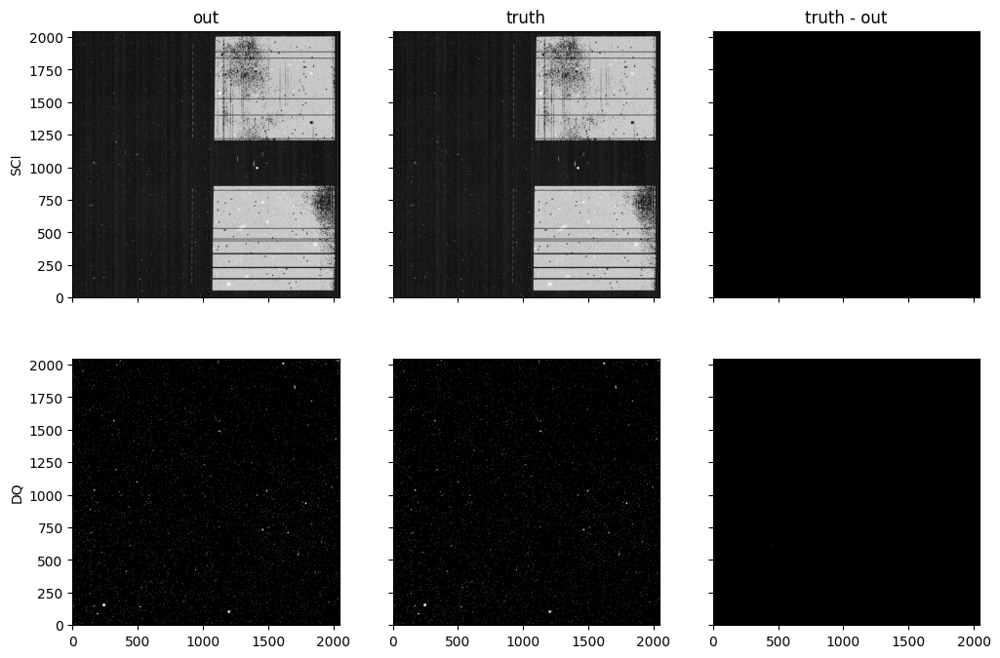

In [195]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff)

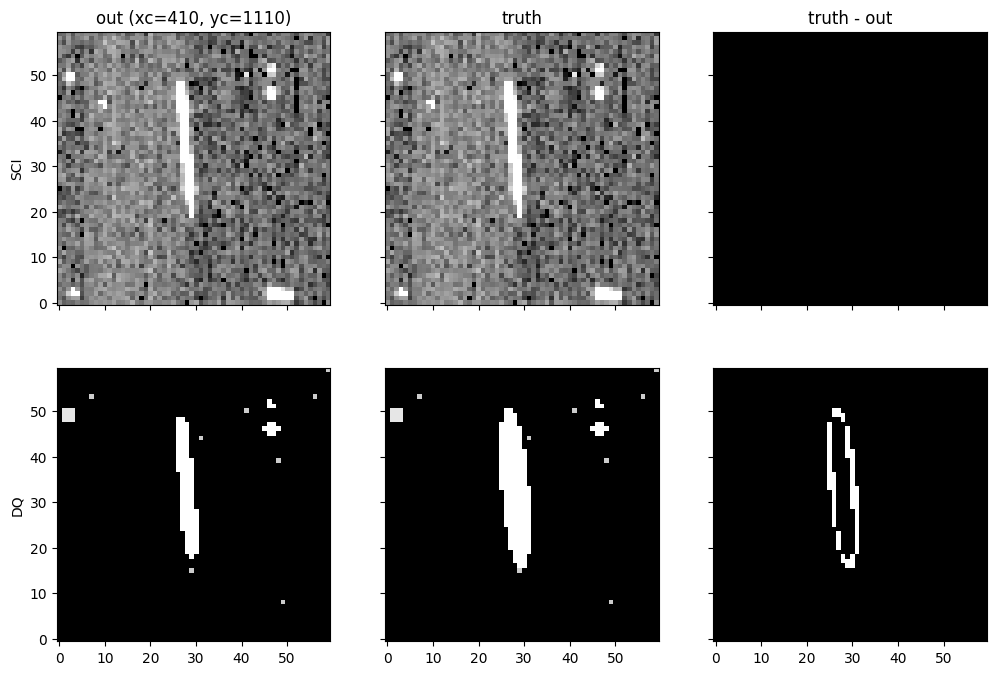

In [196]:
# Zoomed in
plot(sci_out[0, 1, ...], sci_truth[0, 1, ...], sci_diff[0, 1, ...],
     dq_out[0, 1, ...], dq_truth[0, 1, ...], dq_diff[0, 1, ...],
     xc=410, yc=1110, r=30)

# Failure 30/38

`jwst/regtest/test_nirspec_verify.py`

`test_verify_detector1[rate]`

In [197]:
ROOT = "jw01970002001_03101_00001_nrs1"
suffix = "rate"
output = f"{ROOT}_{suffix}.fits"

out_file = rt_results_path / f"3974_test_verify_detector1/{output}"
truth_file = bidata_path / f"test_nirspec_verify/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
207 different pixels found
Maximum relative difference: 74.73514556884766
Maximum absolute difference: 1.775461196899414
*** DQ ***
206 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [198]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [199]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


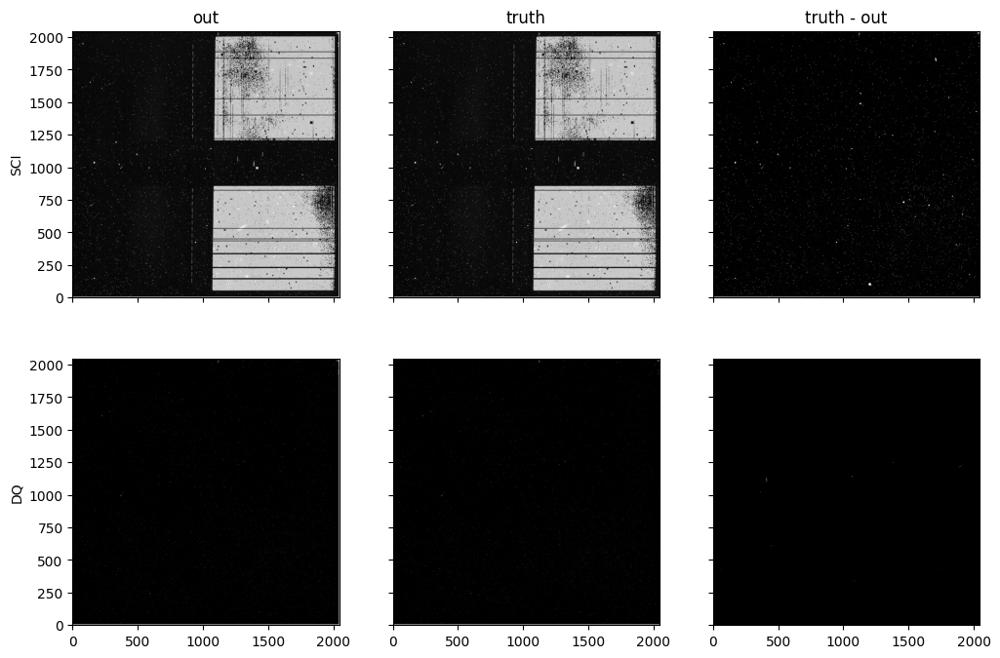

In [201]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff)

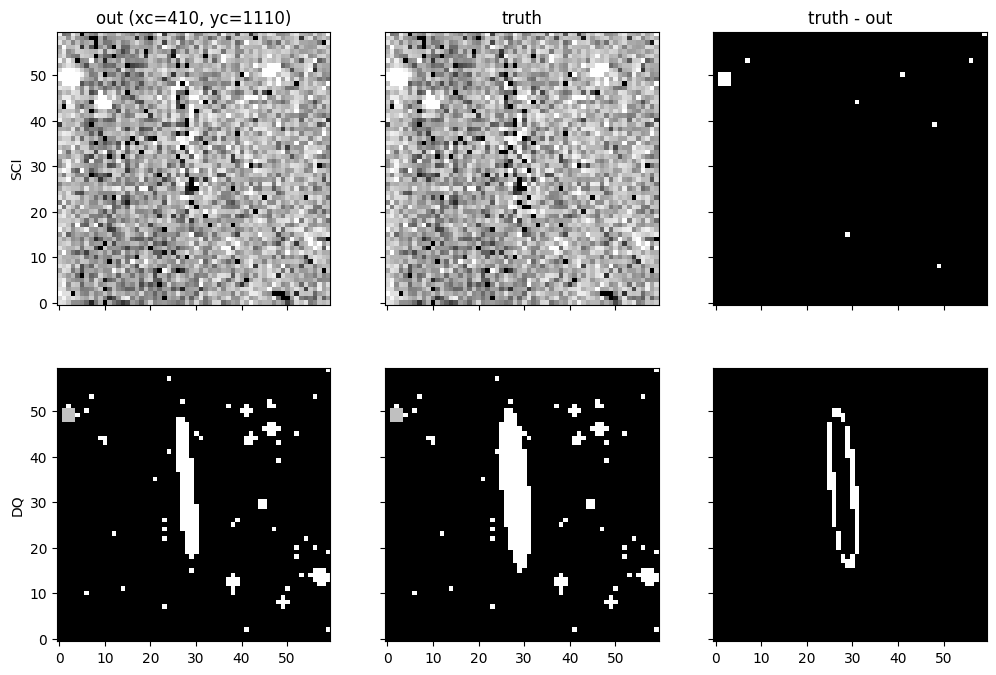

In [203]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=410, yc=1110, r=30,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 31/38

`jwst/regtest/test_nirspec_verify.py`

`test_verify_image2[assign_wcs]`

In [204]:
ROOT = "jw01970002001_03101_00001_nrs1"
suffix = "assign_wcs"
output = f"{ROOT}_{suffix}.fits"

out_file = rt_results_path / f"3975_test_verify_image2/{output}"
truth_file = bidata_path / f"test_nirspec_verify/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
207 different pixels found
Maximum relative difference: 74.73514556884766
Maximum absolute difference: 1.775461196899414
*** DQ ***
206 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [205]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [206]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


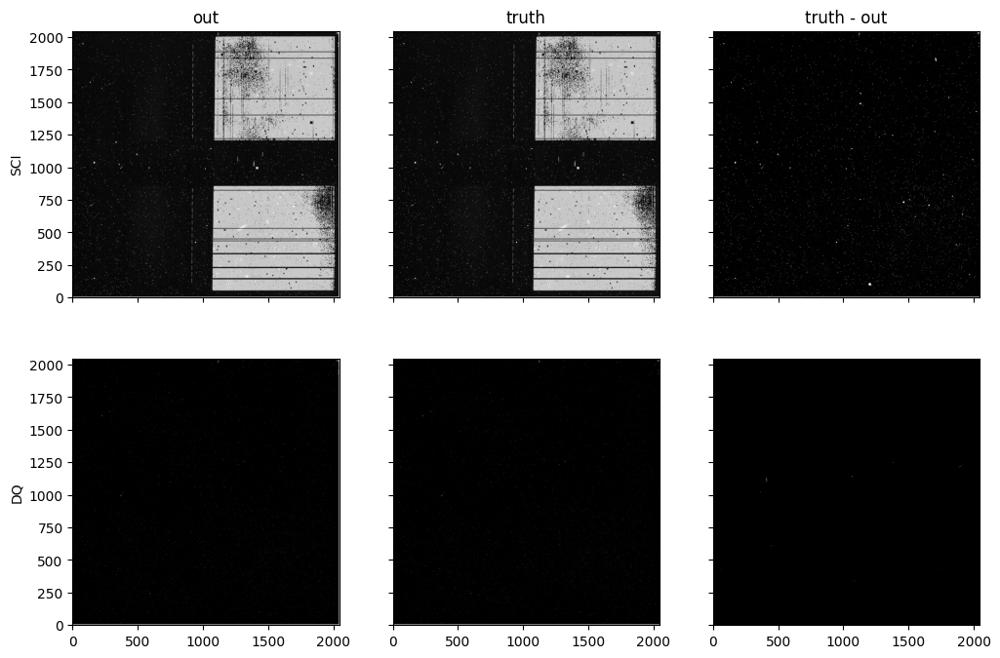

In [207]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff)

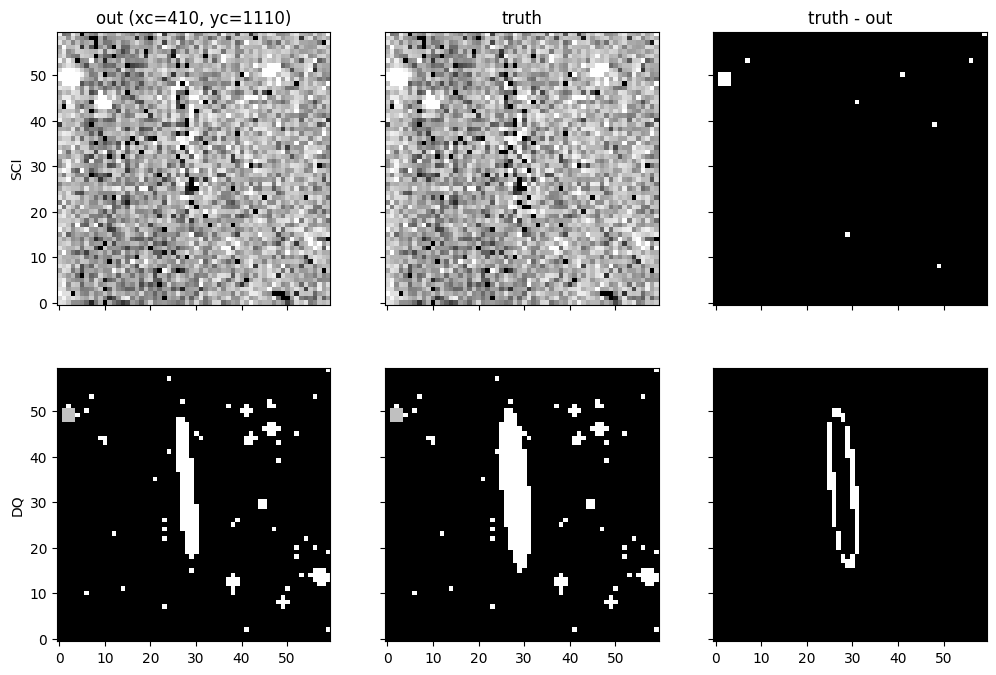

In [209]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=410, yc=1110, r=30,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 32/38

`jwst/regtest/test_nirspec_verify.py`

`test_verify_image2[flat_field]`

In [210]:
ROOT = "jw01970002001_03101_00001_nrs1"
suffix = "flat_field"
output = f"{ROOT}_{suffix}.fits"

out_file = rt_results_path / f"3976_test_verify_image2/{output}"
truth_file = bidata_path / f"test_nirspec_verify/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
207 different pixels found
Maximum relative difference: 74.73514556884766
Maximum absolute difference: 1.7542343139648438
*** DQ ***
206 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [211]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [212]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


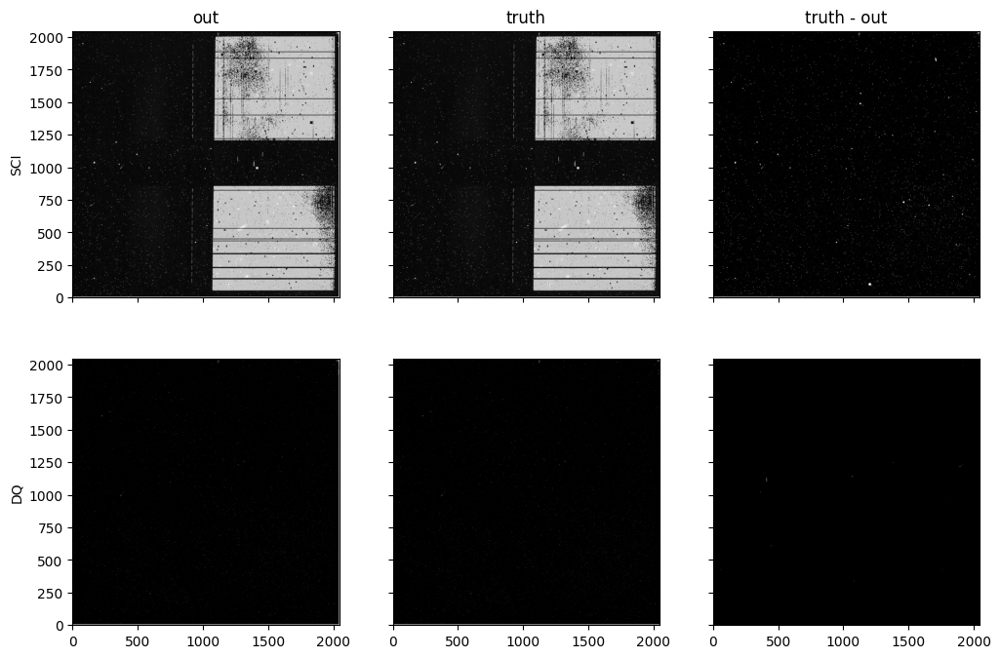

In [213]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff)

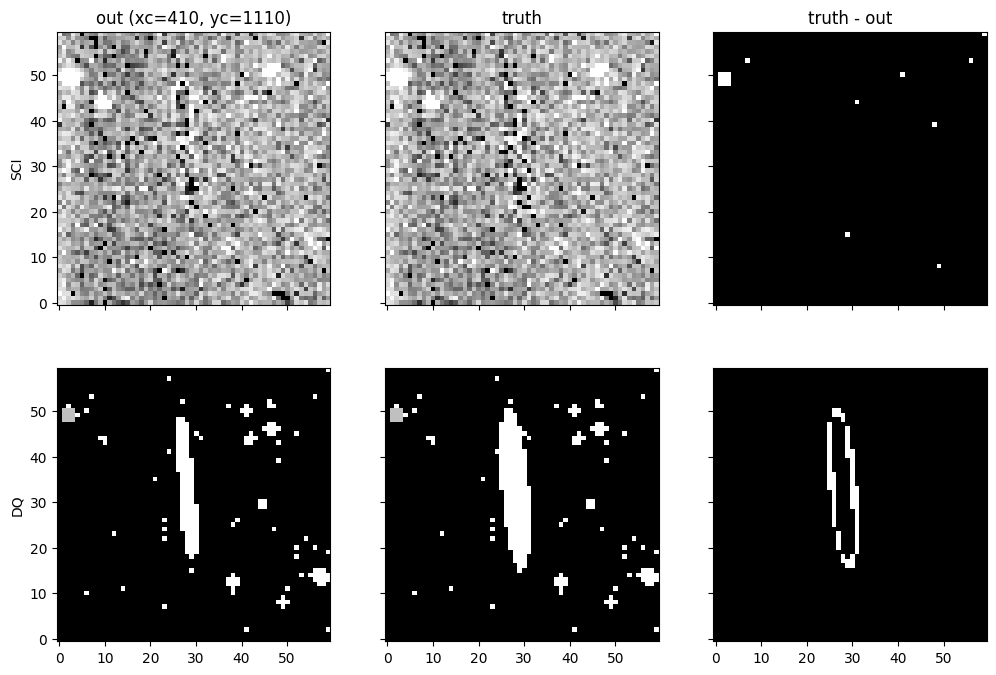

In [215]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=410, yc=1110, r=30,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 33/38

`jwst/regtest/test_nirspec_verify.py`

`test_verify_image2[cal]`

In [216]:
ROOT = "jw01970002001_03101_00001_nrs1"
suffix = "cal"
output = f"{ROOT}_{suffix}.fits"

out_file = rt_results_path / f"3977_test_verify_image2/{output}"
truth_file = bidata_path / f"test_nirspec_verify/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
207 different pixels found
Maximum relative difference: 74.73514556884766
Maximum absolute difference: 1.7542343139648438
*** DQ ***
206 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [217]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [218]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


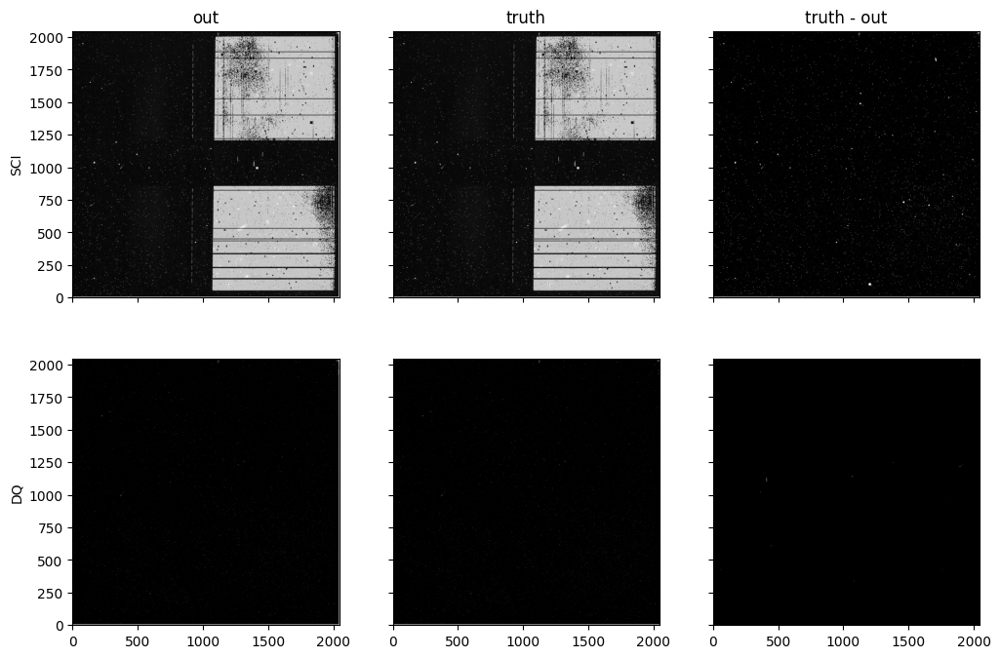

In [219]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff)

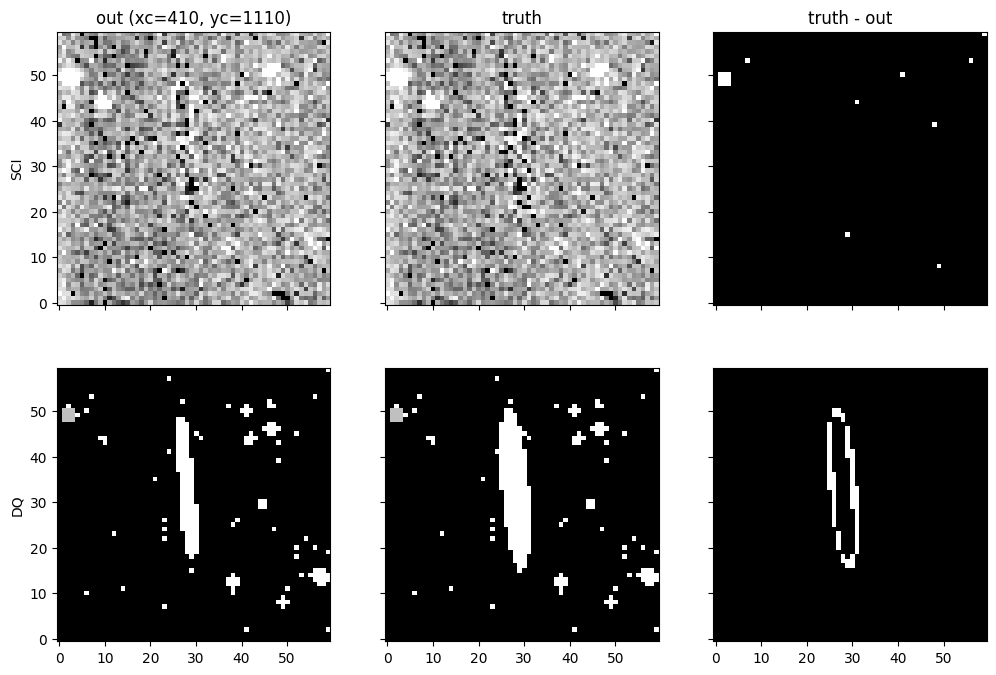

In [221]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=410, yc=1110, r=30,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(90), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(90), "stretch": LinearStretch()}})

# Failure 34/38

`jwst/regtest/test_niriss_image.py`

`test_niriss_image_detector1_multiprocess_jump` 

In [222]:
truth_dir = "test_niriss_image"
suffix = "jump"
output = f"jw01094001002_02107_00001_nis_{suffix}.fits"

out_file = rt_results_path / f"3604_test_niriss_image_detector1_multiprocess_jump/{output}"
truth_file = bidata_path / f"test_niriss_image/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0
*** DQ ***
78 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [223]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [224]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


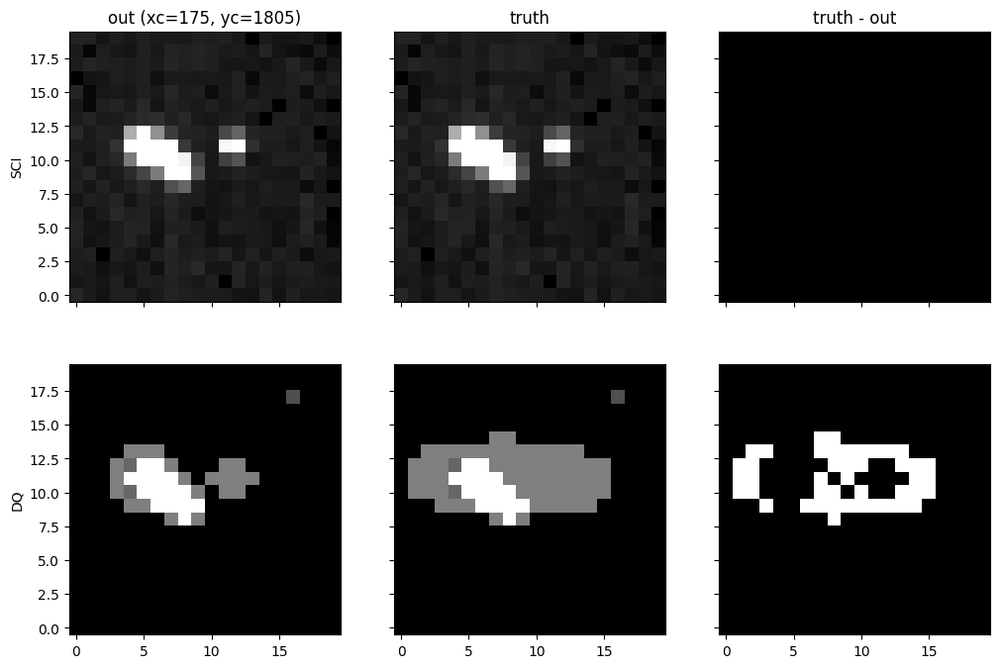

In [225]:
# Whole frame
plot(sci_out[1, 9, ...], sci_truth[1, 9, ...], sci_diff[1, 9, ...],
     dq_out[1, 9, ...], dq_truth[1, 9, ...], dq_diff[1, 9, ...],
     xc=175, yc=1805, r=10)

# Failure 35/38

`jwst/regtest/test_nirspec_picture_frame.py`

`test_nirspec_picture_frame[picture_frame]`

In [226]:
suffix = "picture_frame"
output = f"jw04291001001_03101_00001_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3957_test_nirspec_picture_frame/{output}"
truth_file = bidata_path / f"test_nirspec_picture_frame/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
16994693 different pixels found
Maximum relative difference: 149.0
Maximum absolute difference: 0.015625
*** DQ ***
7423 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [227]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [228]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


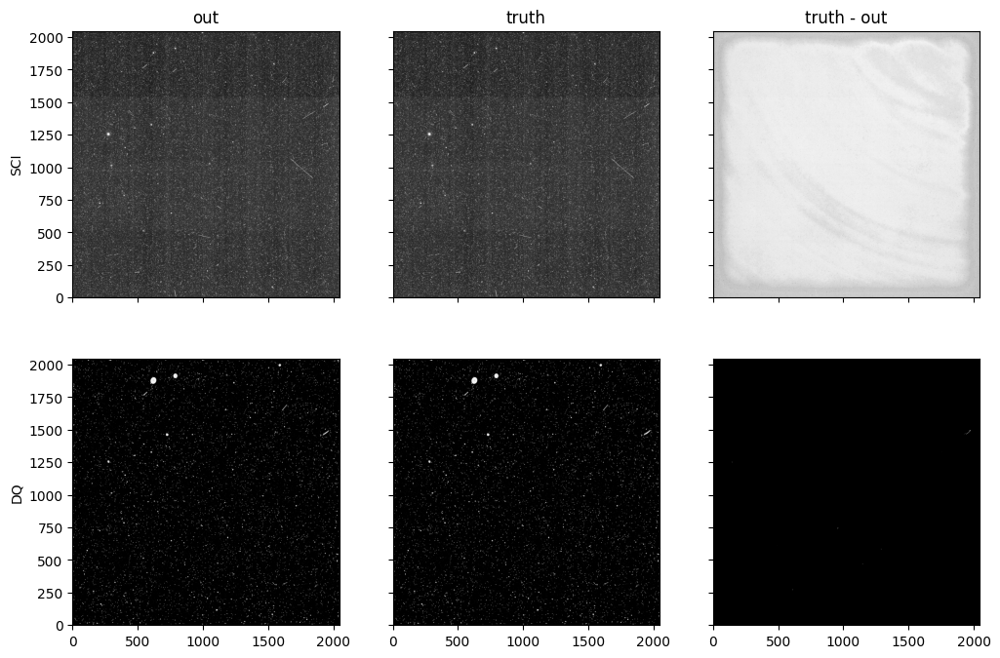

In [261]:
# Whole frame
plot(sci_out[0, 24, ...], sci_truth[0, 24, ...], sci_diff[0, 24, ...],
     dq_out[0, 24, ...], dq_truth[0, 24, ...], dq_diff[0, 24, ...])

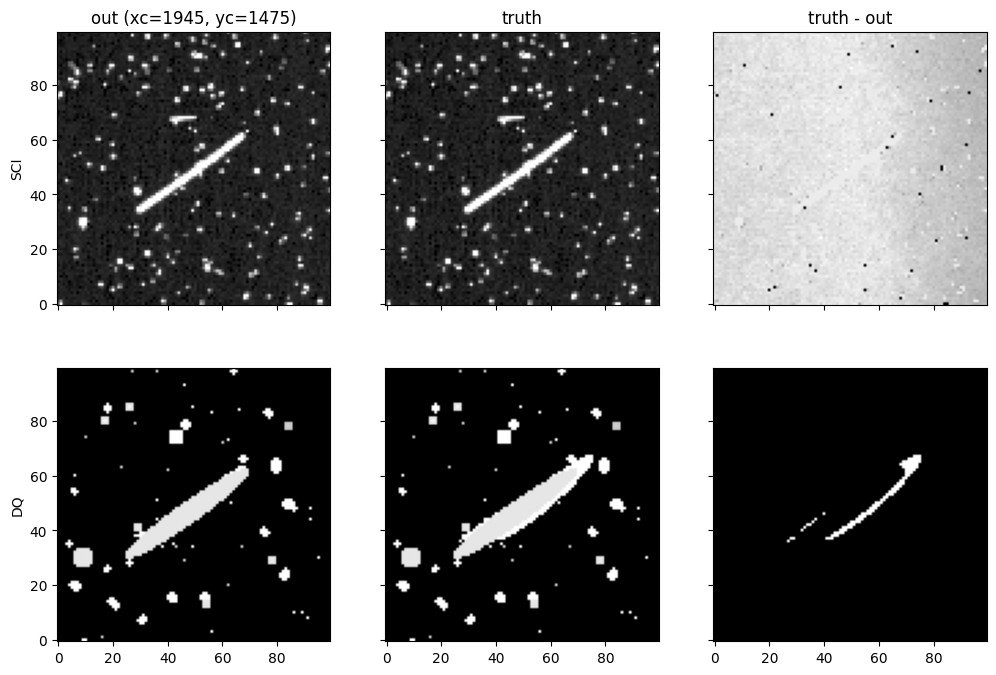

In [262]:
# Zoomed in
plot(sci_out[0, 24, ...], sci_truth[0, 24, ...], sci_diff[0, 24, ...],
     dq_out[0, 24, ...], dq_truth[0, 24, ...], dq_diff[0, 24, ...],
     xc=1945, yc=1475, r=50)

# Failure 36/38

`jwst/regtest/test_nirspec_picture_frame.py`

`test_nirspec_picture_frame[pctfrm_mask]`

In [263]:
suffix = "pctfrm_mask"
output = f"jw04291001001_03101_00001_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3958_test_nirspec_picture_frame/{output}"
truth_file = bidata_path / f"test_nirspec_picture_frame/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

# No DQ extension!

*** SCI ***
36 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 1.0


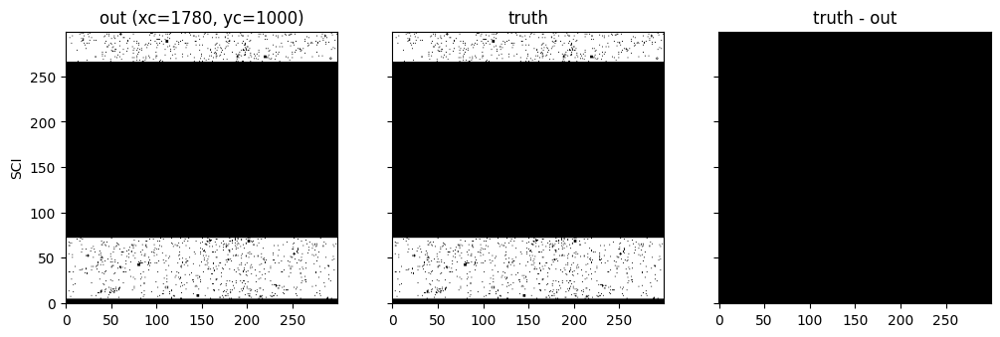

In [264]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff, None, None, None, xc=1780, yc=1000, r=150)

# Failure 37/38

`jwst/regtest/test_nirspec_picture_frame.py`

`test_nirspec_picture_frame[pctfrm_correction]`

In [265]:
suffix = "pctfrm_correction"
output = f"jw04291001001_03101_00001_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3959_test_nirspec_picture_frame/{output}"
truth_file = bidata_path / f"test_nirspec_picture_frame/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("GROUPDQ", 1))
dq_truth = fits.getdata(truth_file, ext=("GROUPDQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
71485682 different pixels found
Maximum relative difference: 58.0
Maximum absolute difference: 0.015625
*** DQ ***
0 different pixels found
Maximum relative difference: 0
Maximum absolute difference: 0


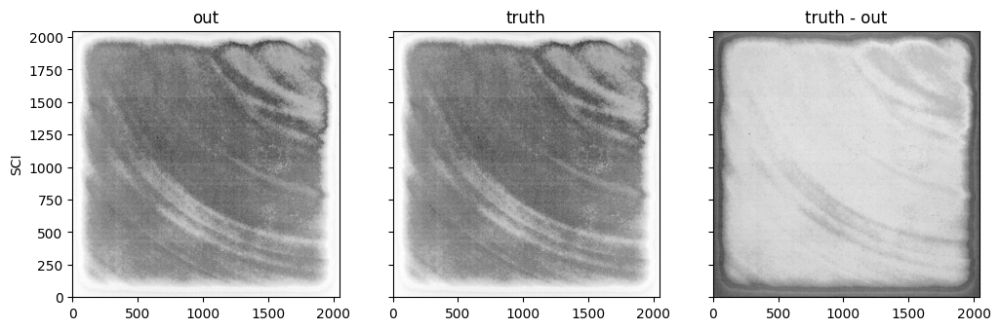

In [266]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, None, None, None)

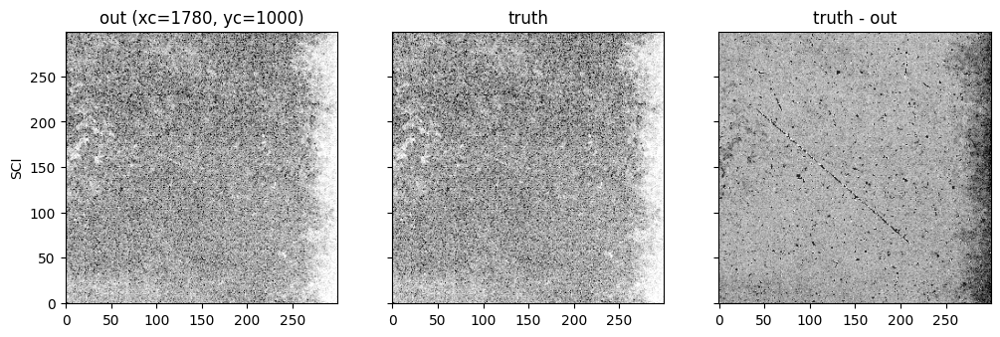

In [267]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff, None, None, None, xc=1780, yc=1000, r=150)

# Failure 38/38

`jwst/regtest/test_nirspec_picture_frame.py`

`test_nirspec_picture_frame[rate]`

In [268]:
suffix = "rate"
output = f"jw04291001001_03101_00001_nrs2_{suffix}.fits"

out_file = rt_results_path / f"3960_test_nirspec_picture_frame/{output}"
truth_file = bidata_path / f"test_nirspec_picture_frame/{output}"

sci_out = fits.getdata(out_file, ext=("SCI", 1))
sci_truth = fits.getdata(truth_file, ext=("SCI", 1))
sci_diff = sci_truth - sci_out

i_sci_diff, max_absolute_sci, max_relative_sci = where_not_allclose(
    sci_out, sci_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** SCI ***")
print(f"{len(i_sci_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_sci}")
print(f"Maximum absolute difference: {max_absolute_sci}")

dq_out = fits.getdata(out_file, ext=("DQ", 1))
dq_truth = fits.getdata(truth_file, ext=("DQ", 1))

i_dq_diff, max_absolute_dq, max_relative_dq = where_not_allclose(
    dq_out, dq_truth,
    rtol=fitsdiff_default_kwargs["rtol"],
    atol=fitsdiff_default_kwargs["atol"],
    return_maxdiff=True
)
print("*** DQ ***")
print(f"{len(i_dq_diff[0])} different pixels found")
print(f"Maximum relative difference: {max_relative_dq}")
print(f"Maximum absolute difference: {max_absolute_dq}")

*** SCI ***
141173 different pixels found
Maximum relative difference: 3876.367431640625
Maximum absolute difference: 0.24656333029270172
*** DQ ***
3717 different pixels found
Maximum relative difference: 1.0
Maximum absolute difference: 4.0


In [269]:
# Make sure extra DQ flags all in truth only
assert np.count_nonzero((dq_out & ~dq_truth) != 0) == 0

In [270]:
# Flags in truth but not new output
dq_diff = ~dq_out & dq_truth

for x in list(set(dq_diff.ravel().tolist())):
    if x == 0:
        continue
    print(f"{x}: {", ".join(dqflags.dqflags_to_mnemonics(x, mnemonic_map=dqflags.pixel))}")

4: JUMP_DET


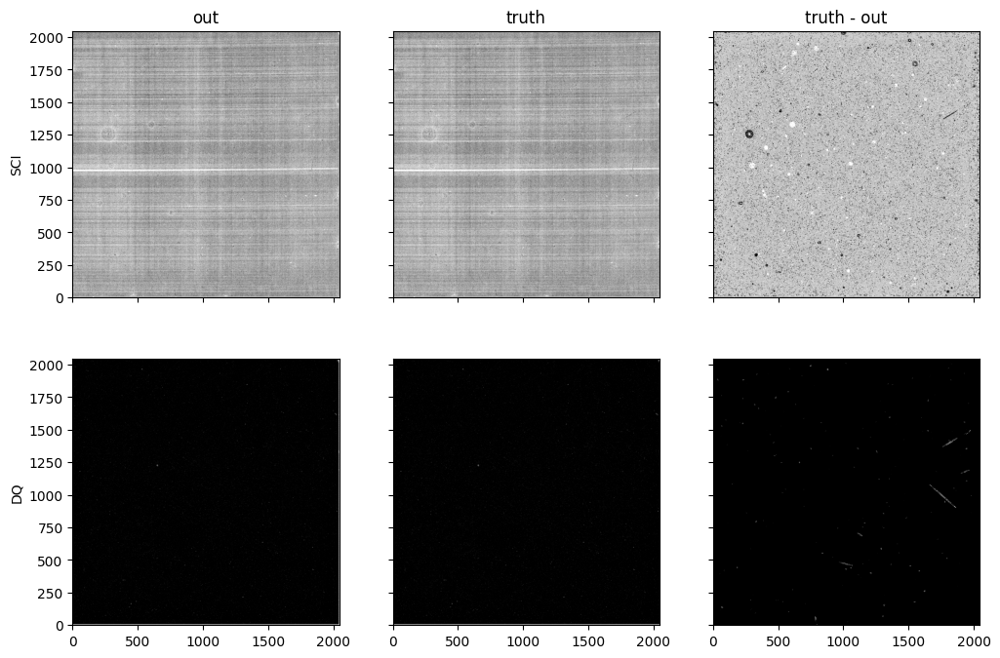

In [271]:
# Whole frame
plot(sci_out, sci_truth, sci_diff, dq_out, dq_truth, dq_diff)

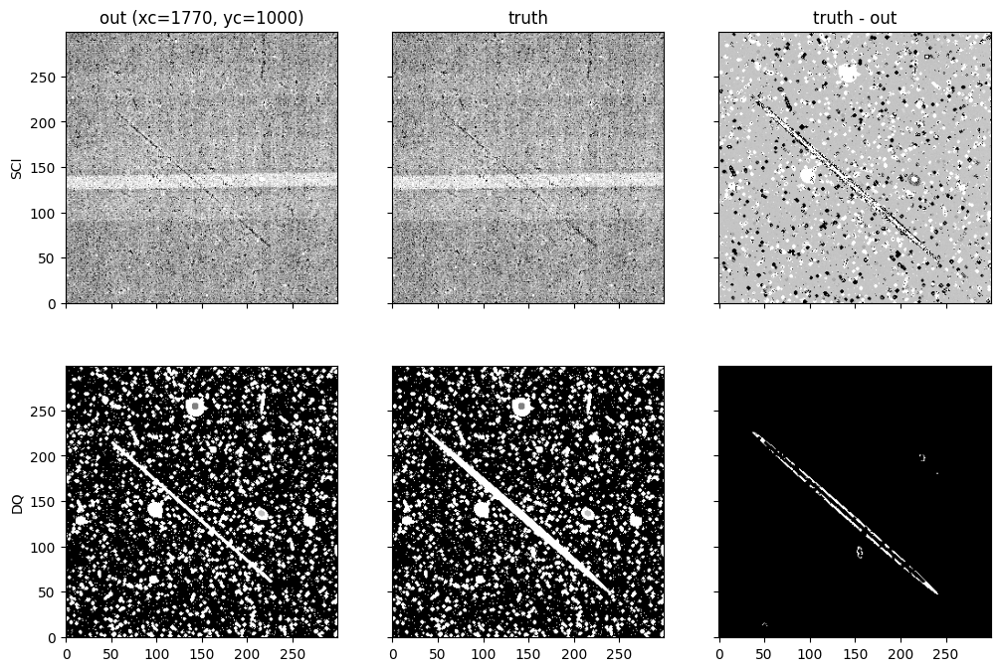

In [276]:
# Zoomed in
plot(sci_out, sci_truth, sci_diff,
     dq_out, dq_truth, dq_diff,
     xc=1770, yc=1000, r=150,
     imshow_kwargs={
         "im3": {"interval": PercentileInterval(80), "stretch": LinearStretch()},
         "im4": {"interval": PercentileInterval(80), "stretch": LinearStretch()}})